In [3]:
#LCMV beamforming for deep source localization
import os.path as op
import matplotlib
import matplotlib.pyplot as plt
import mne
import numpy as np
import joblib
from mne.beamformer import apply_lcmv, make_lcmv
from mne import make_forward_solution, setup_source_space, setup_volume_source_space

In [4]:
s = '029'
path = '/users/mgarson.stu/.anaconda/VML'
meg_path = op.join(path, 'MEG')
mri_path = op.join(path, 'MRI')
sub = f'vml_meg_{s}'
subj = f'vml_mri_{s}'

In [5]:
meg_data = op.join(meg_path, sub, 'vml_meg_%s_tsss_ica_rot_ave.fif' %s)
meg_data2 = op.join(meg_path, sub, 'vml_meg_%s_tsss_ica_run_ave.fif' %s)

evoked = mne.read_evokeds(meg_data, proj=True, kind='average', verbose=False) #rot 
evoked2 = mne.read_evokeds(meg_data2, proj=True, kind='average', verbose=False) #run

bem_dir = op.join(mri_path, subj, 'bem')
fname_aseg = op.join(mri_path, subj, 'mri', 'aseg.mgz')
fname_model = op.join(bem_dir, f"{s}-bem-model.fif")
fname_bem = op.join(bem_dir, f"{s}-bem-sol.fif")
fname_trans = op.join(meg_path, sub, f'{sub}-trans.fif')
erm_noise_cov = mne.read_cov(op.join(meg_path, f'vml_meg_{s}', f'{s}_noise-cov.fif'))

    306 x 306 full covariance (kind = 1) found.


In [6]:
rot_epochs = mne.read_epochs(op.join('VML', 'MEG', sub, f'{sub}_rot_epochs-epo.fif'), verbose=False)
run_epochs = mne.read_epochs(op.join('VML', 'MEG', sub, f'{sub}_run_epochs-epo.fif'), verbose=False)

if rot_epochs.baseline == run_epochs.baseline and evoked[0].baseline == evoked2[0].baseline: 
    print (f'Baselines are all the same:{rot_epochs.baseline}')
else:
    print('Baselines are Different')

Baselines are all the same:(-0.5, -0.30000001192092896)


In [7]:
labels_vol = [ 
    'Right-Cerebellum-Cortex',
    'Right-Cerebellum-White-Matter',
    'Left-Cerebellum-Cortex',
    'Left-Cerebellum-White-Matter'
]

#Lets try adding an occipital region to the volume source space: 
surf_src = mne.setup_source_space(subj, spacing="ico5", add_dist="patch", 
                             subjects_dir=mri_path, verbose=False)

vol_src = setup_volume_source_space(
    subj,
    mri = fname_aseg,
    pos = 5.0,
    bem = fname_model, 
    add_interpolator = True,
    volume_label = labels_vol,
    subjects_dir = mri_path,
    verbose=False
)

src = surf_src + vol_src
print(
    f"The source space contains {len(src)} spaces and "
    f"{sum(s['nuse'] for s in src)} vertices"
)

src.plot(subjects_dir=mri_path)
mne.viz.plot_alignment(
    src=surf_src,
    trans=fname_trans,
    subject=subj,
    subjects_dir=mri_path,
    bem=fname_bem,
    meg=True,          # Show MEG sensors and helmet
    eeg=False,         # You can set EEG to False if you don't want EEG electrodes
    surfaces='head',   # Visualize the head surface
    coord_frame='head' # Use the head coordinate frame
)

The source space contains 6 spaces and 21447 vertices
Using pyvistaqt 3d backend.
Loading BEM surfaces from /users/mgarson.stu/.anaconda/VML\MRI\vml_mri_029\bem\029-bem-sol.fif...
    1 BEM surfaces found
    Reading a surface...
[done]
    1 BEM surfaces read
Could not find the surface for head in the provided BEM model, looking in the subject directory.
Using outer_skin.surf for head surface.


In [8]:
#Read in forward solution and ERM noise recording
fwd = make_forward_solution(evoked[0].info, fname_trans, src, fname_bem)
fwd2 = make_forward_solution(evoked2[0].info, fname_trans, src, fname_bem)

mne.write_forward_solution(op.join(meg_path, sub,  f'{s}-cerebellar-fw-solution-rot.fif'), fwd, overwrite=True)
mne.write_forward_solution(op.join(meg_path, sub,  f'{s}-cerebellar-fw-solution-run.fif'), fwd2, overwrite=True)

#fwd = mne.read_forward_solution(op.join(meg_path, sub, f'{s}-cerebellar-fw-solution-rot.fif'), verbose=False)
#fwd2 = mne.read_forward_solution(op.join(meg_path, sub, f'{s}-cerebellar-fw-solution-run.fif'), verbose=False)
print((mne.utils.object_diff(fwd, fwd)))

src = fwd['src']

Source space          : <SourceSpaces: [<surface (lh), n_vertices=117148, n_used=10242>, <surface (rh), n_vertices=115309, n_used=10242>, <volume (Right-Cerebellum-Cortex), n_used=381>, <volume (Right-Cerebellum-White-Matter), n_used=110>, <volume (Left-Cerebellum-Cortex), n_used=378>, <volume (Left-Cerebellum-White-Matter), n_used=94>] MRI (surface RAS) coords, subject 'vml_mri_029', ~294.8 MB>
MRI -> head transform : \users\mgarson.stu\.anaconda\VML\MEG\vml_meg_029\vml_meg_029-trans.fif
Measurement data      : instance of Info
Conductor model   : /users/mgarson.stu/.anaconda/VML\MRI\vml_mri_029\bem\029-bem-sol.fif
Accurate field computations
Do computations in head coordinates
Free source orientations

Read 6 source spaces a total of 21447 active source locations

Coordinate transformation: MRI (surface RAS) -> head
    0.997947 -0.056225 0.030672       3.46 mm
    0.041404 0.931718 0.360814      22.04 mm
    -0.048864 -0.358803 0.932133      62.36 mm
    0.000000 0.000000 0.000000  

C:\Users\mgarson.stu\AppData\Local\Temp\ipykernel_7256\4087528809.py:5: RuntimeWarning: This filename (/users/mgarson.stu/.anaconda/VML\MEG\vml_meg_029\029-cerebellar-fw-solution-rot.fif) does not conform to MNE naming conventions. All forward files should end with -fwd.fif, -fwd.fif.gz, _fwd.fif, _fwd.fif.gz, -fwd.h5 or _fwd.h5
  mne.write_forward_solution(op.join(meg_path, sub,  f'{s}-cerebellar-fw-solution-rot.fif'), fwd, overwrite=True)


    [done]
    Write a source space...
    [done]
    Write a source space...
    [done]
    6 source spaces written
Overwriting existing file.
    Write a source space...
    [done]
    Write a source space...
    [done]
    Write a source space...
    [done]


C:\Users\mgarson.stu\AppData\Local\Temp\ipykernel_7256\4087528809.py:6: RuntimeWarning: This filename (/users/mgarson.stu/.anaconda/VML\MEG\vml_meg_029\029-cerebellar-fw-solution-run.fif) does not conform to MNE naming conventions. All forward files should end with -fwd.fif, -fwd.fif.gz, _fwd.fif, _fwd.fif.gz, -fwd.h5 or _fwd.h5
  mne.write_forward_solution(op.join(meg_path, sub,  f'{s}-cerebellar-fw-solution-run.fif'), fwd2, overwrite=True)


    Write a source space...
    [done]
    Write a source space...
    [done]
    Write a source space...
    [done]
    6 source spaces written



In [9]:
#print((mne.utils.object_diff(rot_data_cov, run_data_cov)))

    Setting small MEG eigenvalues to zero (without PCA)
Reducing data rank from 306 -> 71
Estimating covariance using SHRUNK
Done.
Estimating covariance using DIAGONAL_FIXED
    MAG regularization : 0.1
    GRAD regularization : 0.1
Done.
Estimating covariance using EMPIRICAL
Done.
Using cross-validation to select the best estimator.
    MAG regularization : 0.1
    GRAD regularization : 0.1
    MAG regularization : 0.1
    GRAD regularization : 0.1
    MAG regularization : 0.1
    GRAD regularization : 0.1
Number of samples used : 17061
log-likelihood on unseen data (descending order):
   shrunk: -352.856
   diagonal_fixed: -425.473
   empirical: -586.801
selecting best estimator: shrunk
[done]
    Setting small MEG eigenvalues to zero (without PCA)
Reducing data rank from 306 -> 71
Estimating covariance using SHRUNK
Done.
Estimating covariance using DIAGONAL_FIXED
    MAG regularization : 0.1
    GRAD regularization : 0.1
Done.
Estimating covariance using EMPIRICAL
Done.
Using cross-

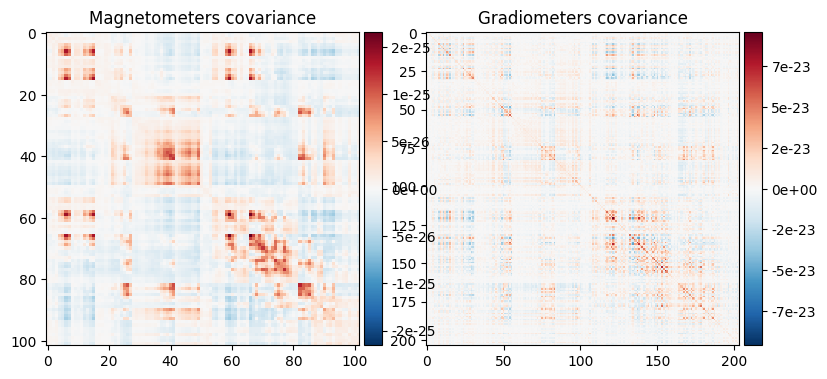

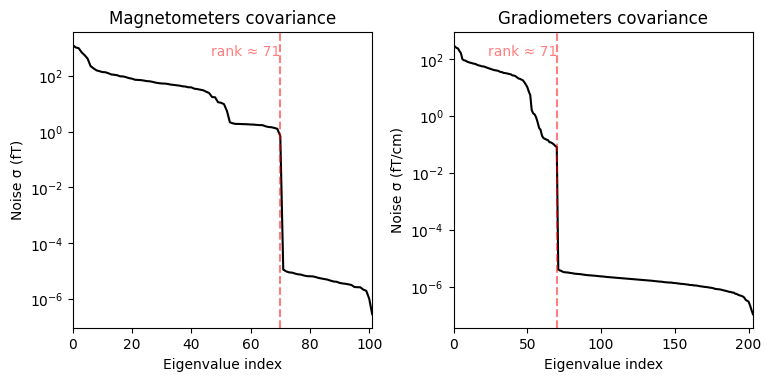

Computing rank from covariance with rank=None
    Using tolerance 3.7e-14 (2.2e-16 eps * 102 dim * 1.6  max singular value)
    Estimated rank (mag): 71
    MAG: rank 71 computed from 102 data channels with 0 projectors
Computing rank from covariance with rank=None
    Using tolerance 4.4e-13 (2.2e-16 eps * 204 dim * 9.7  max singular value)
    Estimated rank (grad): 71
    GRAD: rank 71 computed from 204 data channels with 0 projectors


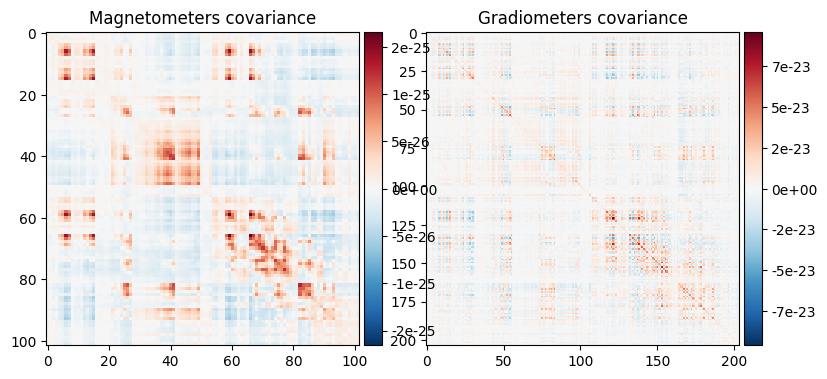

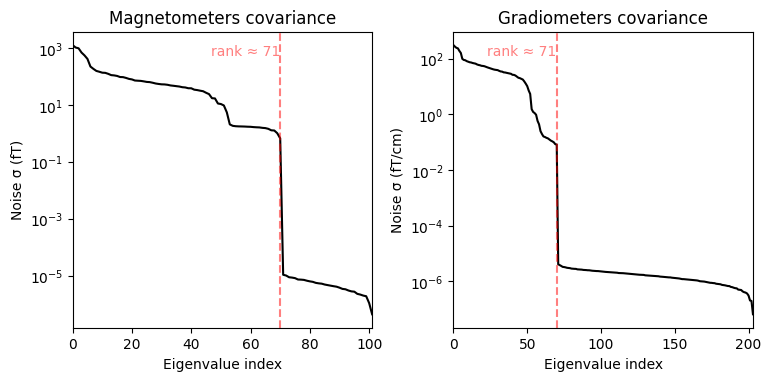

{'meg': 71}
{'meg': 71}
{'meg': 73}


C:\Users\mgarson.stu\AppData\Local\Temp\ipykernel_7256\257274241.py:13: RuntimeWarning: Something went wrong in the data-driven estimation of the data rank as it exceeds the theoretical rank from the info (73 > 71). Consider setting rank to "auto" or setting it explicitly as an integer.
  noise_cov_rank = mne.compute_rank(erm_noise_cov, info=rot_epochs.info, verbose=False)


In [10]:
#Compute the data covariance across all the conditions
rot_data_cov = mne.compute_covariance(rot_epochs, tmin=0.01, tmax=0.15, method='auto', rank='info') 
run_data_cov = mne.compute_covariance(run_epochs, tmin=0.01, tmax=0.15, method='auto', rank='info')                                      
#rot_noise_cov = mne.compute_covariance(rot_epochs, tmin=-0.2, tmax=0, method='auto', rank='info')

#Plot covariances to determine rank 
rot_data_cov.plot(info=rot_epochs.info)
run_data_cov.plot(info=run_epochs.info)

#Compute rank of covariance matrices used to make LCMV filters: 
data_rank_rot = mne.compute_rank(rot_data_cov, info=rot_epochs.info, verbose=False)
data_rank_run = mne.compute_rank(run_data_cov, info=run_epochs.info, verbose=False)
noise_cov_rank = mne.compute_rank(erm_noise_cov, info=rot_epochs.info, verbose=False)

print(data_rank_rot)
print(data_rank_run)
print(noise_cov_rank)

In [ ]:
#Compute LCMV filters for each condition

rot_filters = make_lcmv(
    rot_epochs.info,
    fwd,
    rot_data_cov,
    reg=0.05,
    noise_cov=erm_noise_cov,
    pick_ori="max-power",
    weight_norm="unit-noise-gain",
    rank=data_rank_rot,
    depth=0.5, 
    reduce_rank=True,
    verbose=True
)

run_filters = make_lcmv(
    run_epochs.info,
    fwd,
    run_data_cov,
    reg=0.05,
    noise_cov=erm_noise_cov,
    pick_ori="max-power",
    weight_norm="unit-noise-gain",
    rank=data_rank_run,
    depth=0.5, 
    reduce_rank=True,
    verbose=True
)

print((mne.utils.object_diff(rot_filters, run_filters)))#Ensures that both outputs aren't the same 

#Save filters
rot_filters.save(op.join(meg_path, sub, f'{s}-rot_filters-lcmv.h5'), overwrite=True, verbose=False)
run_filters.save(op.join(meg_path, sub, f'{s}-run_filters-lcmv.h5'), overwrite=True, verbose=False)

Excluding 16 channel(s) missing from the provided forward operator and/or covariance matrices
Computing rank from covariance with rank={'meg': 71}
Computing rank from covariance with rank={'meg': 71}
Making LCMV beamformer with rank {'meg': 71}
Computing inverse operator with 306 channels.
    306 out of 306 channels remain after picking
Selected 306 channels
Creating the depth weighting matrix...
Whitening the forward solution.
Computing rank from covariance with rank={'meg': 71}
    Setting small MEG eigenvalues to zero (without PCA)
Creating the source covariance matrix
Adjusting source covariance matrix.
Computing beamformer filters for 21447 sources
Filter computation complete
Excluding 16 channel(s) missing from the provided forward operator and/or covariance matrices
Computing rank from covariance with rank={'meg': 71}
Computing rank from covariance with rank={'meg': 71}
Making LCMV beamformer with rank {'meg': 71}
Computing inverse operator with 306 channels.
    306 out of 306

In [13]:
#Plot All Conditions: 
conds = ['right no-rotation', 'left no-rotation', 'left rotation', 'right rotation']
conds2 = ['run 1 ', 'run 2 ', 'run 3', 'run 4', 'run 5 ']

for x in range(len(conds)): 
    stc = apply_lcmv(evoked[x], rot_filters)
    stc.save(op.join(meg_path, sub, f'DS_{s}_cond-{conds[x]}'), overwrite=True)

    brain = stc.plot(surface='white',
                    subject=subj,
                    subjects_dir=mri_path,
                    src=src,
                    initial_time=0.16,
                    hemi='both',
                    smoothing_steps=10,
                    verbose=False,
                    show_traces=True)

    brain.add_text(text=f'{conds[x]}', x=0.2, y=0.9, font_size=20, color='white')
    #brain.clear_glyphs()
    del stc

#Run Conditions
for x in range(len(conds2)): 
    stc = apply_lcmv(evoked2[x], run_filters)
    stc.save(op.join(meg_path, sub, f'DS_{s}_cond-{conds2[x]}'), overwrite=True)

    brain = stc.plot(surface='white',
                    subject=subj,
                    subjects_dir=mri_path,
                    src=src,
                    initial_time=0.16,
                    hemi='both',
                    smoothing_steps=10,
                    verbose=False,
                    show_traces=True)

    brain.add_text(text=f'{conds2[x]}', x=0.2, y=0.9, font_size=20, color='white')
    #brain.clear_glyphs()
    del stc

Overwriting existing file.
Overwriting existing file.
Overwriting existing file.
Overwriting existing file.
Overwriting existing file.
Overwriting existing file.
Overwriting existing file.
Overwriting existing file.
Overwriting existing file.


In [ ]:
#Read in an stc-h5 and plot it 
stc = mne.read_source_estimate(op.join(meg_path, sub, f'DS_{s}_cond-left no-rotation-stc.h5'))

brain = stc.plot(surface='white',
                    time_viewer= True,
                    hemi='both',
                    smoothing_steps=10,
                    verbose=False, 
                    show_traces=True)

Using control points [0.06144436 0.06772612 0.11493256]


In [15]:
#Compare LCMV STCs with dSPM ones: 
 
for x in range(len(conds)): 
	#Right no-rotation
	rh_stc = mne.read_source_estimate(op.join(meg_path, sub, 'old_stc_plots', f'Final{s}_cond-{conds[x]}-rh.stc'))
	lh_stc = mne.read_source_estimate(op.join(meg_path, sub, 'old_stc_plots', f'Final{s}_cond-{conds[x]}-lh.stc'))
	stc = rh_stc + lh_stc

	brain = stc.plot(subjects_dir=mri_path, 
						subject=subj, 
						time_viewer= True, 
						surface="white",  
						hemi='both', 
						time_unit='s', 
						smoothing_steps=7, 
						brain_kwargs=dict(title='right no-rotation'))

	brain.add_text(text=f'OLD {conds[x]} STC', font_size=20, color='white', x=0.2, y=0.9)
	brain.show() 

	del stc


OSError: SourceEstimate File(s) not found for: '/users/mgarson.stu/.anaconda/VML\\MEG\\vml_meg_029\\old_stc_plots\\Final029_cond-right no-rotation-rh.stc'

In [ ]:
#Setup Source Space for AVG_CHILD. Best resolution that I could get working was oct6 for children and ico5 for adults. 
subj = 'vml_avg_child'
src = mne.setup_source_space(subj, spacing="oct6", subjects_dir=mri_path, verbose=False)
src.save(op.join(mri_path, subj, 'bem', f'{subj}-oct-6-src.fif'), overwrite=True)
src.plot()

    Write a source space...
    [done]
    Write a source space...
    [done]
    2 source spaces written


In [ ]:
#Create a source space including cerebellum for fsaverage: 

average_sub = subj = 'fsaverage' #Change this to vml_avg_child to setup averaged volume src for children
bem_dir = op.join(mri_path, subj, 'bem')
fname_aseg = op.join(mri_path, subj, 'mri', 'aseg.mgz')

src_to = mne.read_source_spaces(op.join(mri_path, average_sub, 'bem', f'{average_sub}-ico-5-src.fif'))#change to oct6 for vml_avg_child

model = mne.make_bem_model(subject=subj, ico=5, conductivity=(0.3,),
                           subjects_dir=mri_path)

mne.write_bem_surfaces(op.join(mri_path, subj, 'bem', f'{subj}-bem-model.fif'), model, overwrite=True)

fname_model = op.join(bem_dir, f"{subj}-bem-model.fif")

labels_vol = [ 
    'Right-Cerebellum-Cortex',
    'Right-Cerebellum-White-Matter',
    'Left-Cerebellum-Cortex',
    'Left-Cerebellum-White-Matter'
]

fs_avg_vol_src = setup_volume_source_space(
    subj,
    mri = fname_aseg,
    pos = 5.0,
    bem = fname_model, 
    add_interpolator = True,
    volume_label = labels_vol,
    subjects_dir = mri_path
)

src_to += fs_avg_vol_src
src_to.save(op.join(mri_path, subj, 'bem', f'{subj}-mixed-src.fif'))
src_to.plot()

    Reading a source space...
    [done]
    Reading a source space...
    [done]
    2 source spaces read
Creating the BEM geometry...
Going from 5th to 5th subdivision of an icosahedron (n_tri: 20480 -> 20480)
inner skull CM is  -0.53 -21.10   6.21 mm
Surfaces passed the basic topology checks.
Complete.

Overwriting existing file.
BEM              : c:\users\mgarson.stu\.anaconda\VML\MRI\fsaverage\bem\fsaverage-bem-model.fif
grid                  : 5.0 mm
mindist               : 5.0 mm
MRI volume            : /users/mgarson.stu/.anaconda/VML\MRI\fsaverage\mri\aseg.mgz

Reading /users/mgarson.stu/.anaconda/VML\MRI\fsaverage\mri\aseg.mgz...

Loaded inner skull from c:\users\mgarson.stu\.anaconda\VML\MRI\fsaverage\bem\fsaverage-bem-model.fif (10242 nodes)
Surface CM = (  -0.5  -21.1    6.2) mm
Surface fits inside a sphere with radius   98.3 mm
Surface extent:
    x =  -75.3 ...   76.3 mm
    y = -113.4 ...   75.0 mm
    z =  -72.4 ...   88.2 mm
Grid extent:
    x =  -80.0 ...   80.0 mm


In [116]:
print(conds2)

['run 1 ', 'run 2 ', 'run 3', 'run 4', 'run 5 ']


In [ ]:
conditions = ['right no-rotation', 'left no-rotation', 'right rotation' ,'left rotation']
conds2 = ['run 1 ', 'run 2 ', 'run 3', 'run 4', 'run 5 ']
#subjects = ['vml_meg_011', 'vml_meg_012', 'vml_meg_013', 'vml_meg_014', 'vml_meg_016', 'vml_meg_018', 
            # 'vml_meg_019', 'vml_meg_021', 'vml_meg_022', 'vml_meg_023', 'vml_meg_024', 'vml_meg_025', 
            # 'vml_meg_026', 'vml_meg_030', 'vml_meg_031']
#subs = ['011', '012', '013', '014', '016', '018', '019',  '021', '022', '023', '024', '025', '026', '030', '031'] #VML adults

subjects = ['vml_meg_002', 'vml_meg_003', 'vml_meg_004', 'vml_meg_006', 
            'vml_meg_009', 'vml_meg_010', 'vml_meg_015', 'vml_meg_016', 
            'vml_meg_027', 'vml_meg_028', 'vml_meg_029']

subs = ['002', '003', '004', '006', '009', '010', '015', '016', '027', '028', '029']#Children

for s in subs:
    print(s)
    #here is where I need the correct source space for each subject 
    fwd = mne.read_forward_solution(op.join(meg_path, f'vml_meg_{s}', f'{s}-cerebellar-fw-solution-run.fif'), verbose=False)
    src = fwd['src']

    morph = mne.compute_source_morph( 
            src = src,
            subject_from=f"vml_mri_{s}",
            subject_to = 'vml_avg_child',
            src_to=src_to, #fsaverage's volumetric src
            subjects_dir=mri_path,
            # niter_sdr=[5, 5,  2],
            # niter_affine=[5, 5, 2],
            verbose=False
        )
    
    morph_mat = morph.compute_vol_morph_mat()
    morph.save(op.join(meg_path, f'vml_meg_{s}', f'{s}-morph'), overwrite=True)
    morph = mne.read_source_morph(op.join(meg_path, f'vml_meg_{s}', f'{s}-morph-morph.h5'))

    for cond in conditions: 
        stc = mne.read_source_estimate(op.join(meg_path, f'vml_meg_{s}', f'DS_{s}_cond-{cond}-stc.h5')) 
        morphed_stc = morph.apply(stc)
        morphed_stc.save(op.join(meg_path, f'vml_meg_{s}', f'morphed_DS_{s}_cond-{cond}-stc.h5'), overwrite=True)

002


C:\Users\mgarson.stu\AppData\Local\Temp\ipykernel_54656\35927597.py:17: RuntimeWarning: This filename (/users/mgarson.stu/.anaconda/VML\MEG\vml_meg_002\002-cerebellar-fw-solution-run.fif) does not conform to MNE naming conventions. All forward files should end with -fwd.fif, -fwd.fif.gz, _fwd.fif, _fwd.fif.gz, -fwd.h5 or _fwd.h5
  fwd = mne.read_forward_solution(op.join(meg_path, f'vml_meg_{s}', f'{s}-cerebellar-fw-solution-run.fif'), verbose=False)


Computing sparse volumetric morph matrix (will take some time...)


  0%|          | Vertex : 0/1102 [00:00<?,       ?it/s]

003


C:\Users\mgarson.stu\AppData\Local\Temp\ipykernel_54656\35927597.py:17: RuntimeWarning: This filename (/users/mgarson.stu/.anaconda/VML\MEG\vml_meg_003\003-cerebellar-fw-solution-run.fif) does not conform to MNE naming conventions. All forward files should end with -fwd.fif, -fwd.fif.gz, _fwd.fif, _fwd.fif.gz, -fwd.h5 or _fwd.h5
  fwd = mne.read_forward_solution(op.join(meg_path, f'vml_meg_{s}', f'{s}-cerebellar-fw-solution-run.fif'), verbose=False)


Computing sparse volumetric morph matrix (will take some time...)


  0%|          | Vertex : 0/1001 [00:00<?,       ?it/s]

004


C:\Users\mgarson.stu\AppData\Local\Temp\ipykernel_54656\35927597.py:17: RuntimeWarning: This filename (/users/mgarson.stu/.anaconda/VML\MEG\vml_meg_004\004-cerebellar-fw-solution-run.fif) does not conform to MNE naming conventions. All forward files should end with -fwd.fif, -fwd.fif.gz, _fwd.fif, _fwd.fif.gz, -fwd.h5 or _fwd.h5
  fwd = mne.read_forward_solution(op.join(meg_path, f'vml_meg_{s}', f'{s}-cerebellar-fw-solution-run.fif'), verbose=False)


Computing sparse volumetric morph matrix (will take some time...)


  0%|          | Vertex : 0/1020 [00:00<?,       ?it/s]

006


C:\Users\mgarson.stu\AppData\Local\Temp\ipykernel_54656\35927597.py:17: RuntimeWarning: This filename (/users/mgarson.stu/.anaconda/VML\MEG\vml_meg_006\006-cerebellar-fw-solution-run.fif) does not conform to MNE naming conventions. All forward files should end with -fwd.fif, -fwd.fif.gz, _fwd.fif, _fwd.fif.gz, -fwd.h5 or _fwd.h5
  fwd = mne.read_forward_solution(op.join(meg_path, f'vml_meg_{s}', f'{s}-cerebellar-fw-solution-run.fif'), verbose=False)


Computing sparse volumetric morph matrix (will take some time...)


  0%|          | Vertex : 0/876 [00:00<?,       ?it/s]

009


C:\Users\mgarson.stu\AppData\Local\Temp\ipykernel_54656\35927597.py:17: RuntimeWarning: This filename (/users/mgarson.stu/.anaconda/VML\MEG\vml_meg_009\009-cerebellar-fw-solution-run.fif) does not conform to MNE naming conventions. All forward files should end with -fwd.fif, -fwd.fif.gz, _fwd.fif, _fwd.fif.gz, -fwd.h5 or _fwd.h5
  fwd = mne.read_forward_solution(op.join(meg_path, f'vml_meg_{s}', f'{s}-cerebellar-fw-solution-run.fif'), verbose=False)


Computing sparse volumetric morph matrix (will take some time...)


  0%|          | Vertex : 0/1168 [00:00<?,       ?it/s]

010


C:\Users\mgarson.stu\AppData\Local\Temp\ipykernel_54656\35927597.py:17: RuntimeWarning: This filename (/users/mgarson.stu/.anaconda/VML\MEG\vml_meg_010\010-cerebellar-fw-solution-run.fif) does not conform to MNE naming conventions. All forward files should end with -fwd.fif, -fwd.fif.gz, _fwd.fif, _fwd.fif.gz, -fwd.h5 or _fwd.h5
  fwd = mne.read_forward_solution(op.join(meg_path, f'vml_meg_{s}', f'{s}-cerebellar-fw-solution-run.fif'), verbose=False)


Computing sparse volumetric morph matrix (will take some time...)


  0%|          | Vertex : 0/932 [00:00<?,       ?it/s]

015


C:\Users\mgarson.stu\AppData\Local\Temp\ipykernel_54656\35927597.py:17: RuntimeWarning: This filename (/users/mgarson.stu/.anaconda/VML\MEG\vml_meg_015\015-cerebellar-fw-solution-run.fif) does not conform to MNE naming conventions. All forward files should end with -fwd.fif, -fwd.fif.gz, _fwd.fif, _fwd.fif.gz, -fwd.h5 or _fwd.h5
  fwd = mne.read_forward_solution(op.join(meg_path, f'vml_meg_{s}', f'{s}-cerebellar-fw-solution-run.fif'), verbose=False)


Computing sparse volumetric morph matrix (will take some time...)


  0%|          | Vertex : 0/1191 [00:00<?,       ?it/s]

016


C:\Users\mgarson.stu\AppData\Local\Temp\ipykernel_54656\35927597.py:17: RuntimeWarning: This filename (/users/mgarson.stu/.anaconda/VML\MEG\vml_meg_016\016-cerebellar-fw-solution-run.fif) does not conform to MNE naming conventions. All forward files should end with -fwd.fif, -fwd.fif.gz, _fwd.fif, _fwd.fif.gz, -fwd.h5 or _fwd.h5
  fwd = mne.read_forward_solution(op.join(meg_path, f'vml_meg_{s}', f'{s}-cerebellar-fw-solution-run.fif'), verbose=False)


Computing sparse volumetric morph matrix (will take some time...)


  0%|          | Vertex : 0/1223 [00:00<?,       ?it/s]

Overwriting existing file.
Overwriting existing file.
Overwriting existing file.
Overwriting existing file.
Overwriting existing file.
Overwriting existing file.
Overwriting existing file.
Overwriting existing file.
027


C:\Users\mgarson.stu\AppData\Local\Temp\ipykernel_54656\35927597.py:17: RuntimeWarning: This filename (/users/mgarson.stu/.anaconda/VML\MEG\vml_meg_027\027-cerebellar-fw-solution-run.fif) does not conform to MNE naming conventions. All forward files should end with -fwd.fif, -fwd.fif.gz, _fwd.fif, _fwd.fif.gz, -fwd.h5 or _fwd.h5
  fwd = mne.read_forward_solution(op.join(meg_path, f'vml_meg_{s}', f'{s}-cerebellar-fw-solution-run.fif'), verbose=False)


Computing sparse volumetric morph matrix (will take some time...)


  0%|          | Vertex : 0/952 [00:00<?,       ?it/s]

028


C:\Users\mgarson.stu\AppData\Local\Temp\ipykernel_54656\35927597.py:17: RuntimeWarning: This filename (/users/mgarson.stu/.anaconda/VML\MEG\vml_meg_028\028-cerebellar-fw-solution-run.fif) does not conform to MNE naming conventions. All forward files should end with -fwd.fif, -fwd.fif.gz, _fwd.fif, _fwd.fif.gz, -fwd.h5 or _fwd.h5
  fwd = mne.read_forward_solution(op.join(meg_path, f'vml_meg_{s}', f'{s}-cerebellar-fw-solution-run.fif'), verbose=False)


Computing sparse volumetric morph matrix (will take some time...)


  0%|          | Vertex : 0/1000 [00:00<?,       ?it/s]

029


C:\Users\mgarson.stu\AppData\Local\Temp\ipykernel_54656\35927597.py:17: RuntimeWarning: This filename (/users/mgarson.stu/.anaconda/VML\MEG\vml_meg_029\029-cerebellar-fw-solution-run.fif) does not conform to MNE naming conventions. All forward files should end with -fwd.fif, -fwd.fif.gz, _fwd.fif, _fwd.fif.gz, -fwd.h5 or _fwd.h5
  fwd = mne.read_forward_solution(op.join(meg_path, f'vml_meg_{s}', f'{s}-cerebellar-fw-solution-run.fif'), verbose=False)


Computing sparse volumetric morph matrix (will take some time...)


  0%|          | Vertex : 0/963 [00:00<?,       ?it/s]

In [89]:
print(conds2)
print(conditions)
print(conds2)

['run 1 ', 'run 2 ', 'run 3', 'run 4', 'run 5 ']
['right no-rotation', 'left no-rotation', 'right rotation', 'left rotation']
['run 1 ', 'run 2 ', 'run 3', 'run 4', 'run 5 ']


In [ ]:
#Average source estimates across a group of participants 

conds2 = ['run 1 ', 'run 2 ', 'run 3', 'run 4', 'run 5 ']

for cond in conds2: 
    # Load STC plots for mixed source space
    # stc_p002 = mne.read_source_estimate(op.join(meg_path, 'vml_meg_002', f'morphed_DS_002_cond-{cond}-stc.h5'))
    # stc_p003 = mne.read_source_estimate(op.join(meg_path, 'vml_meg_003', f'morphed_DS_003_cond-{cond}-stc.h5'))
    # stc_p004 = mne.read_source_estimate(op.join(meg_path, 'vml_meg_004', f'morphed_DS_004_cond-{cond}-stc.h5'))
    # stc_p006 = mne.read_source_estimate(op.join(meg_path, 'vml_meg_006', f'morphed_DS_006_cond-{cond}-stc.h5'))
    # stc_p009 = mne.read_source_estimate(op.join(meg_path, 'vml_meg_009', f'morphed_DS_009_cond-{cond}-stc.h5'))
    # stc_p010 = mne.read_source_estimate(op.join(meg_path, 'vml_meg_010', f'morphed_DS_010_cond-{cond}-stc.h5'))
    # stc_p015 = mne.read_source_estimate(op.join(meg_path, 'vml_meg_015', f'morphed_DS_015_cond-{cond}-stc.h5'))
    # stc_p016 = mne.read_source_estimate(op.join(meg_path, 'vml_meg_016', f'morphed_DS_016_cond-{cond}-stc.h5'))
    # stc_p027 = mne.read_source_estimate(op.join(meg_path, 'vml_meg_027', f'morphed_DS_027_cond-{cond}-stc.h5'))
    # stc_p028 = mne.read_source_estimate(op.join(meg_path, 'vml_meg_028', f'morphed_DS_028_cond-{cond}-stc.h5'))
    # stc_p029 = mne.read_source_estimate(op.join(meg_path, 'vml_meg_029', f'morphed_DS_029_cond-{cond}-stc.h5'))
    stc_p011 = mne.read_source_estimate(op.join(meg_path, 'vml_meg_011', f'morphed_DS_011_cond-{cond}-stc.h5'))
    stc_p012 = mne.read_source_estimate(op.join(meg_path, 'vml_meg_012', f'morphed_DS_012_cond-{cond}-stc.h5'))
    stc_p013 = mne.read_source_estimate(op.join(meg_path, 'vml_meg_013', f'morphed_DS_013_cond-{cond}-stc.h5'))
    stc_p014 = mne.read_source_estimate(op.join(meg_path, 'vml_meg_014', f'morphed_DS_014_cond-{cond}-stc.h5'))
    stc_p018 = mne.read_source_estimate(op.join(meg_path, 'vml_meg_018', f'morphed_DS_018_cond-{cond}-stc.h5'))
    stc_p019 = mne.read_source_estimate(op.join(meg_path, 'vml_meg_019', f'morphed_DS_019_cond-{cond}-stc.h5'))
    stc_p021 = mne.read_source_estimate(op.join(meg_path, 'vml_meg_021', f'morphed_DS_021_cond-{cond}-stc.h5'))
    stc_p022 = mne.read_source_estimate(op.join(meg_path, 'vml_meg_022', f'morphed_DS_022_cond-{cond}-stc.h5'))
    stc_p023 = mne.read_source_estimate(op.join(meg_path, 'vml_meg_023', f'morphed_DS_023_cond-{cond}-stc.h5'))
    stc_p024 = mne.read_source_estimate(op.join(meg_path, 'vml_meg_024', f'morphed_DS_024_cond-{cond}-stc.h5'))
    stc_p025 = mne.read_source_estimate(op.join(meg_path, 'vml_meg_025', f'morphed_DS_025_cond-{cond}-stc.h5'))
    stc_p026 = mne.read_source_estimate(op.join(meg_path, 'vml_meg_026', f'morphed_DS_026_cond-{cond}-stc.h5'))
    stc_p030 = mne.read_source_estimate(op.join(meg_path, 'vml_meg_030', f'morphed_DS_030_cond-{cond}-stc.h5'))
    stc_p031 = mne.read_source_estimate(op.join(meg_path, 'vml_meg_031', f'morphed_DS_031_cond-{cond}-stc.h5'))


    all_stcs = [stc_p011, stc_p012, stc_p013, stc_p014, stc_p018, stc_p019, stc_p021, stc_p022, stc_p023, stc_p024, stc_p025, stc_p026, stc_p030, stc_p031] #VML children

    # Initialize an array to store the data for all participants
    data_array = np.zeros((len(all_stcs), all_stcs[0].data.shape[0], all_stcs[0].data.shape[1]))
    # NP.ZEROS(6, 21683, 1701)

    # Check if all source spaces have the same vertices for both hemispheres or volume
    for i, stc in enumerate(all_stcs):
        if stc.data.shape != data_array[0].shape:
            raise ValueError(f"Shape mismatch for subject {i}: {stc.data.shape} vs {data_array[0].shape}")

    # Fill the data array with source estimate data from each participant
    for i, stc in enumerate(all_stcs):
        data_array[i, :, :] = stc.data

    # Calculate the average across participants
    average_data = np.mean(data_array, axis=0)

    #Check that the shape of average data matches the shape of the stc data:
    print(np.shape(average_data), 'is the same as', np.shape(all_stcs[0].data))

    # Create a new SourceEstimate with the averaged data
    average_stc = mne.MixedSourceEstimate(average_data, vertices=all_stcs[0].vertices, tmin=all_stcs[0].times[0], tstep=np.diff(all_stcs[0].times)[0], subject='fsaverage')

    # Save or plot the averaged source estimate
    average_stc.save(op.join(meg_path, f'VML_adult_morphed-averaged_DS_{cond}'), ftype='h5', overwrite=True)


(21683, 1701) is the same as (21683, 1701)
Overwriting existing file.
(21683, 1701) is the same as (21683, 1701)
Overwriting existing file.
(21683, 1701) is the same as (21683, 1701)
(21683, 1701) is the same as (21683, 1701)
(21683, 1701) is the same as (21683, 1701)
Overwriting existing file.


In [15]:
print(meg_path)

/users/mgarson.stu/.anaconda/VML\MEG


In [ ]:
#Plot the averaged STCs 

titles = ['Baseline', 'Early-Learning', 'Late Learning', 'Washout', 'Re-Learning']
conds = ['run 1', 'run 2', 'run 3', 'run 4', 'run 5']
conditions = ['right no-rotation', 'left no-rotation', 'right rotation', 'left rotation']
i = 0
j = 0 
src_to = mne.read_source_spaces(op.join(mri_path, 'vml_avg_child', 'bem', 'vml_avg_child-mixed-src.fif'))
adult_src = mne.read_source_spaces(op.join(mri_path, 'fsaverage', 'bem', 'fsaverage-mixed-src.fif'), verbose=False)

for cond in conds:
    print(cond)
    avg_stc = mne.read_source_estimate(op.join(meg_path, f'VML_child_morphed-averaged_DS_{cond} -stc.h5'))
    brain = avg_stc.plot(src=src_to, subject='vml_avg_child', subjects_dir=mri_path, surface='white', hemi='split', views=['lat'], smoothing_steps=10)
    brain.add_text(text=f'{titles[i]}-CHILD-AVERAGED-STC', font_size=20, color='white', x=0.2, y=0.9)
    
    # brain.save_movie(
    #     filename=(op.join(meg_path, f'Child_Avg_{titles[i]}.mov')),
    #     time_dilation=60,  # Adjust this value to control the speed of the video
    #     tmin=0,  # Start time
    #     tmax=0.5,  # End time
    #     framerate=24,  # Frames per second
    #     interpolation='linear'
    # )
    # print('saved movie for child', titles[i])
    # # Close the Brain object to release resources
    # brain.close()
    # i += 1 

#clim=dict(kind="value", lims=[0.02, 0.03, 0.04]),


    Reading a source space...
    Computing patch statistics...
    Patch information added...
    Distance information added...
    [done]
    Reading a source space...
    Computing patch statistics...
    Patch information added...
    Distance information added...
    [done]
    Reading a source space...
    [done]
    Reading a source space...
    [done]
    Reading a source space...
    [done]
    Reading a source space...
    [done]
    6 source spaces read
run 1
Using control points [0.05909885 0.06613107 0.12055321]
run 2
Using control points [0.03826345 0.04349487 0.08628707]
run 3
Using control points [0.03842845 0.04298155 0.07904477]
run 4
Using control points [0.03411534 0.03800251 0.06548878]
run 5
Using control points [0.04034596 0.044921   0.07921282]


In [ ]:
titles = ['Baseline', 'Early-Learning', 'Late Learning', 'Washout', 'Re-Learning']
conds = ['run 1', 'run 2', 'run 3', 'run 4', 'run 5']
conditions = ['right no-rotation', 'left no-rotation', 'right rotation', 'left rotation']
i = 0
j = 0 
src_to = mne.read_source_spaces(op.join(mri_path, 'vml_avg_child', 'bem', 'vml_avg_child-mixed-src.fif'))
adult_src = mne.read_source_spaces(op.join(mri_path, 'fsaverage', 'bem', 'fsaverage-mixed-src.fif'), verbose=False)

for cond in conds:
    print(cond)
    avg_stc = mne.read_source_estimate(op.join(meg_path, f'VML_child_morphed-averaged_DS_{cond} -stc.h5'))
    brain = avg_stc.plot(src=src_to, subject='vml_avg_child', subjects_dir=mri_path, surface='white', hemi='split', views=['lat'], smoothing_steps=10)
    brain.add_text(text=f'{titles[i]}-CHILD-AVERAGED-STC', font_size=20, color='white', x=0.2, y=0.9)

In [3]:
titles = ['Baseline', 'Early-Learning', 'Late Learning', 'Washout', 'Re-Learning']
conds = ['run 1', 'run 2', 'run 3', 'run 4', 'run 5']
conditions = ['right no-rotation', 'left no-rotation', 'right rotation', 'left rotation']
i = 0
j = 0 
src_to = mne.read_source_spaces(op.join(mri_path, 'vml_avg_child', 'bem', 'vml_avg_child-mixed-src.fif'))
adult_src = mne.read_source_spaces(op.join(mri_path, 'fsaverage', 'bem', 'fsaverage-mixed-src.fif'), verbose=False)

for cond in conds:
    print(cond)
    avg_stc = mne.read_source_estimate(op.join(meg_path, f'VML_adult_morphed-averaged_DS_{cond} -stc.h5'))
    brain1 = avg_stc.plot(src=adult_src, subject='fsaverage', subjects_dir=mri_path, surface='white', hemi='split', views=['lat'], smoothing_steps=10)
    brain1.add_text(text=f'{titles[j]}-ADULT-AVERAGED-STC', font_size=20, color='white', x=0.2, y=0.9)
    brain1.save_movie(

        filename=(op.join(meg_path, f'Adult_Avg_{titles[j]}.mp4')),
        time_dilation=60,  # Adjust this value to control the speed of the video
        tmin=0,  # Start time
        tmax=0.5,  # End time
        framerate=24,  # Frames per second
        interpolation='linear'
    )
    print('saved movie for adult', titles[j])
    # Close the Brain object to release resources
    brain1.close()
    j += 1

    Reading a source space...
    Computing patch statistics...
    Patch information added...
    Distance information added...
    [done]
    Reading a source space...
    Computing patch statistics...
    Patch information added...
    Distance information added...
    [done]
    Reading a source space...
    [done]
    Reading a source space...
    [done]
    Reading a source space...
    [done]
    Reading a source space...
    [done]
    6 source spaces read
run 1
Using pyvistaqt 3d backend.
Using control points [0.02897924 0.03263325 0.06827639]


C:\Users\mgarson.stu\AppData\Local\Temp\ipykernel_104624\2865411625.py:14: RuntimeWarning: Movie saving aborted:
Traceback (most recent call last):
  File "c:\Users\mgarson.stu\AppData\Local\anaconda3\Lib\site-packages\mne\viz\_brain\_brain.py", line 3790, in _save_movie_tv
    self._save_movie(
  File "c:\Users\mgarson.stu\AppData\Local\anaconda3\Lib\site-packages\mne\viz\_brain\_brain.py", line 3748, in _save_movie
    imageio.mimwrite(filename, images, **kwargs)
  File "c:\Users\mgarson.stu\AppData\Local\anaconda3\Lib\site-packages\imageio\v2.py", line 495, in mimwrite
    return file.write(ims, is_batch=True, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\mgarson.stu\AppData\Local\anaconda3\Lib\site-packages\imageio\plugins\tifffile_v3.py", line 224, in write
    self._fh.write(image, **kwargs)
TypeError: TiffWriter.write() got an unexpected keyword argument 'fps'

  brain1.save_movie(


saved movie for adult Baseline
run 2
Using control points [0.01775283 0.02031674 0.04802299]


C:\Users\mgarson.stu\AppData\Local\Temp\ipykernel_104624\2865411625.py:14: RuntimeWarning: Movie saving aborted:
Traceback (most recent call last):
  File "c:\Users\mgarson.stu\AppData\Local\anaconda3\Lib\site-packages\mne\viz\_brain\_brain.py", line 3790, in _save_movie_tv
    self._save_movie(
  File "c:\Users\mgarson.stu\AppData\Local\anaconda3\Lib\site-packages\mne\viz\_brain\_brain.py", line 3748, in _save_movie
    imageio.mimwrite(filename, images, **kwargs)
  File "c:\Users\mgarson.stu\AppData\Local\anaconda3\Lib\site-packages\imageio\v2.py", line 495, in mimwrite
    return file.write(ims, is_batch=True, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\mgarson.stu\AppData\Local\anaconda3\Lib\site-packages\imageio\plugins\tifffile_v3.py", line 224, in write
    self._fh.write(image, **kwargs)
TypeError: TiffWriter.write() got an unexpected keyword argument 'fps'

  brain1.save_movie(


saved movie for adult Early-Learning
run 3
Using control points [0.01649919 0.01883958 0.04529781]


C:\Users\mgarson.stu\AppData\Local\Temp\ipykernel_104624\2865411625.py:14: RuntimeWarning: Movie saving aborted:
Traceback (most recent call last):
  File "c:\Users\mgarson.stu\AppData\Local\anaconda3\Lib\site-packages\mne\viz\_brain\_brain.py", line 3790, in _save_movie_tv
    self._save_movie(
  File "c:\Users\mgarson.stu\AppData\Local\anaconda3\Lib\site-packages\mne\viz\_brain\_brain.py", line 3748, in _save_movie
    imageio.mimwrite(filename, images, **kwargs)
  File "c:\Users\mgarson.stu\AppData\Local\anaconda3\Lib\site-packages\imageio\v2.py", line 495, in mimwrite
    return file.write(ims, is_batch=True, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\mgarson.stu\AppData\Local\anaconda3\Lib\site-packages\imageio\plugins\tifffile_v3.py", line 224, in write
    self._fh.write(image, **kwargs)
TypeError: TiffWriter.write() got an unexpected keyword argument 'fps'

  brain1.save_movie(


saved movie for adult Late Learning
run 4
Using control points [0.01683869 0.01909652 0.04781029]


C:\Users\mgarson.stu\AppData\Local\Temp\ipykernel_104624\2865411625.py:14: RuntimeWarning: Movie saving aborted:
Traceback (most recent call last):
  File "c:\Users\mgarson.stu\AppData\Local\anaconda3\Lib\site-packages\mne\viz\_brain\_brain.py", line 3790, in _save_movie_tv
    self._save_movie(
  File "c:\Users\mgarson.stu\AppData\Local\anaconda3\Lib\site-packages\mne\viz\_brain\_brain.py", line 3748, in _save_movie
    imageio.mimwrite(filename, images, **kwargs)
  File "c:\Users\mgarson.stu\AppData\Local\anaconda3\Lib\site-packages\imageio\v2.py", line 495, in mimwrite
    return file.write(ims, is_batch=True, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\mgarson.stu\AppData\Local\anaconda3\Lib\site-packages\imageio\plugins\tifffile_v3.py", line 224, in write
    self._fh.write(image, **kwargs)
TypeError: TiffWriter.write() got an unexpected keyword argument 'fps'

  brain1.save_movie(


saved movie for adult Washout
run 5
Using control points [0.01825931 0.02073906 0.04683487]
saved movie for adult Re-Learning


C:\Users\mgarson.stu\AppData\Local\Temp\ipykernel_104624\2865411625.py:14: RuntimeWarning: Movie saving aborted:
Traceback (most recent call last):
  File "c:\Users\mgarson.stu\AppData\Local\anaconda3\Lib\site-packages\mne\viz\_brain\_brain.py", line 3790, in _save_movie_tv
    self._save_movie(
  File "c:\Users\mgarson.stu\AppData\Local\anaconda3\Lib\site-packages\mne\viz\_brain\_brain.py", line 3748, in _save_movie
    imageio.mimwrite(filename, images, **kwargs)
  File "c:\Users\mgarson.stu\AppData\Local\anaconda3\Lib\site-packages\imageio\v2.py", line 495, in mimwrite
    return file.write(ims, is_batch=True, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\mgarson.stu\AppData\Local\anaconda3\Lib\site-packages\imageio\plugins\tifffile_v3.py", line 224, in write
    self._fh.write(image, **kwargs)
TypeError: TiffWriter.write() got an unexpected keyword argument 'fps'

  brain1.save_movie(


In [6]:
plot_labels = mne.get_volume_labels_from_src(src, subj, mri_path)

labels = mne.read_labels_from_annot(
    subject=subj,  # Replace with your subject's name
    parc='aparc',  # Parcellation scheme
    subjects_dir=mri_path  # Path to the FreeSurfer subjects directory
)
print(labels)

surface_aparc_labels = []
for i in range(len(labels)):
    label = labels[i]
    if label.name == 'superiorparietal-lh':
        surface_aparc_labels.append(label)
    elif label.name == 'superiorparietal-rh':
        surface_aparc_labels.append(label)
    elif label.name == 'inferiorparietal-rh':
        surface_aparc_labels.append(label)
    elif label.name == 'inferiorparietal-lh':
        surface_aparc_labels.append(label)

print(surface_aparc_labels)
print(plot_labels)

NameError: name 'src' is not defined

Reading labels from parcellation...
   read 35 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\fsaverage\label\lh.aparc.annot
   read 34 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\fsaverage\label\rh.aparc.annot
Reading labels from parcellation...
   read 35 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\vml_avg_child\label\lh.aparc.annot
   read 35 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\vml_avg_child\label\rh.aparc.annot
the child surface labels are [<Label | vml_avg_child, 'inferiorparietal-lh', lh : 461 vertices>, <Label | vml_avg_child, 'inferiorparietal-rh', rh : 567 vertices>, <Label | vml_avg_child, 'superiorparietal-lh', lh : 673 vertices>, <Label | vml_avg_child, 'superiorparietal-rh', rh : 647 vertices>]
the child volume labels are [<Label | vml_avg_child, 'Cerebellum-Cortex-rh', rh : 580 vertices>, <Label | vml_avg_child, 'Cerebellum-White-Matter-rh', rh : 109 vertices>, <Label | vml_avg_child, 'Cerebellum-Cortex-lh', lh : 633 vertices>, <Label | vm

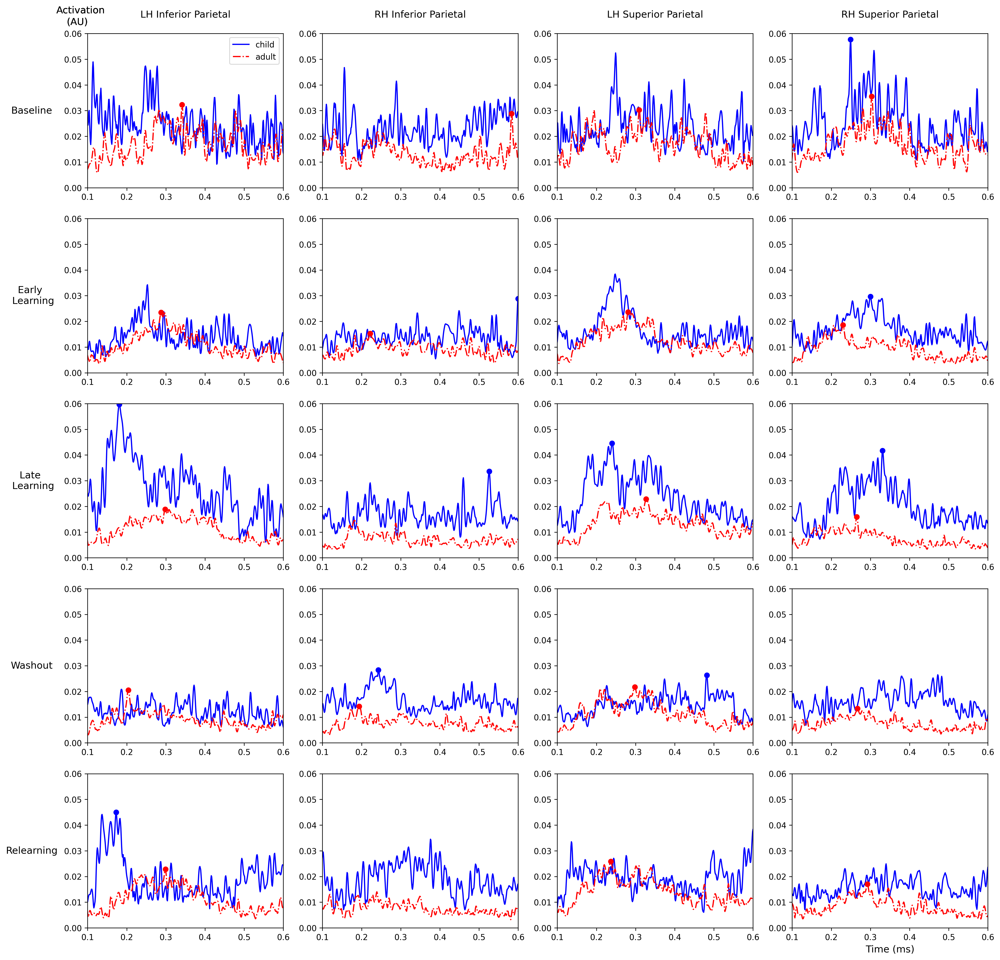

In [6]:
conds = ['run 1', 'run 2', 'run 3', 'run 4', 'run 5']
surf_labels = ['superiorparietal-lh', 'superiorparietal-rh', 'inferiorparietal-lh', 'inferiorparietal-rh']
child = 'vml_avg_child'
adult = 'fsaverage'

#Read in Child/Adult source spaces and generate appropriate volume/surface labels from either averaged subject
child_src = mne.read_source_spaces(op.join(mri_path, 'vml_avg_child', 'bem', 'vml_avg_child-mixed-src.fif'), verbose=False)
adult_src = mne.read_source_spaces(op.join(mri_path, 'fsaverage', 'bem', 'fsaverage-mixed-src.fif'), verbose=False)

child_vol_labels = mne.get_volume_labels_from_src(child_src, subject=child, subjects_dir=mri_path)
adult_vol_labels = mne.get_volume_labels_from_src(adult_src, subject=adult, subjects_dir=mri_path)

adult_surf_labels = mne.read_labels_from_annot(subject=adult, parc='aparc', subjects_dir=mri_path)
child_surf_labels = mne.read_labels_from_annot(subject=child, parc='aparc', subjects_dir=mri_path)
adult_surf_labels = [label for label in adult_surf_labels if label.name in surf_labels] #Keep only the labels specified in surf_labels
child_surf_labels = [label for label in child_surf_labels if label.name in surf_labels] #Keep only the labels specified in surf_labels

print('the child surface labels are', child_surf_labels)
#[<Label | vml_avg_child, 'inferiorparietal-lh', lh : 461 vertices>, <Label | vml_avg_child, 'inferiorparietal-rh', rh : 567 vertices>, 
#<Label | vml_avg_child, 'superiorparietal-lh', lh : 673 vertices>, <Label | vml_avg_child, 'superiorparietal-rh', rh : 647 vertices>]
print('the child volume labels are', child_vol_labels)

fig, axs = plt.subplots(len(conds), len(surf_labels), figsize=(20,20), dpi=300)

i=0
for cond in conds:

    print(cond)
    #Call in the appropriate stc files
    child_stc = mne.read_source_estimate(op.join(meg_path, f'VML_child_morphed-averaged_DS_{cond} -stc.h5'))
    adult_stc = mne.read_source_estimate(op.join(meg_path, f'VML_adult_morphed-averaged_DS_{cond} -stc.h5'))
    child_stc._data = abs(child_stc.data)
    adult_stc._data = abs(adult_stc.data)
    times = child_stc.times

    #Extract the time courses for surface labels and extract timing/max. activation values

    #Children
    child_lh_infparietal_tc = mne.extract_label_time_course(child_stc, labels=child_surf_labels[0], src=child_src, mode='mean')[0]
    max_time_lh_infparietal = np.argmax(child_lh_infparietal_tc)
    max_active_lh_infparietal = np.max(child_lh_infparietal_tc)

    child_rh_infparietal_tc = mne.extract_label_time_course(child_stc, labels=child_surf_labels[1], src=child_src, mode='mean')[0]
    max_time_rh_infparietal = np.argmax(child_rh_infparietal_tc)
    max_active_rh_infparietal = np.max(child_rh_infparietal_tc)

    child_lh_supparietal_tc = mne.extract_label_time_course(child_stc, labels=child_surf_labels[2], src=child_src, mode='mean')[0]
    max_time_lh_supparietal = np.argmax(child_lh_supparietal_tc)
    max_active_lh_supparietal = np.max(child_lh_supparietal_tc)

    child_rh_supparietal_tc = mne.extract_label_time_course(child_stc, labels=child_surf_labels[3], src=child_src, mode='mean')[0]
    max_time_rh_supparietal = np.argmax(child_rh_supparietal_tc)
    max_active_rh_supparietal = np.max(child_rh_supparietal_tc)

    #Adults
    adult_lh_infparietal_tc = mne.extract_label_time_course(adult_stc, labels=adult_surf_labels[0], src=adult_src, mode='mean')[0]
    max_time_lh_infparietal_adult = np.argmax(adult_lh_infparietal_tc)
    max_active_lh_infparietal_adult = np.max(adult_lh_infparietal_tc)

    adult_rh_infparietal_tc = mne.extract_label_time_course(adult_stc, labels=adult_surf_labels[1], src=adult_src, mode='mean')[0]
    max_time_rh_infparietal_adult = np.argmax(adult_rh_infparietal_tc)
    max_active_rh_infparietal_adult = np.max(adult_rh_infparietal_tc)


    adult_lh_supparietal_tc = mne.extract_label_time_course(adult_stc, labels=adult_surf_labels[2], src=adult_src, mode='mean')[0]
    max_time_lh_supparietal_adult = np.argmax(adult_lh_supparietal_tc)
    max_active_lh_supparietal_adult = np.max(adult_lh_supparietal_tc)

    adult_rh_supparietal_tc = mne.extract_label_time_course(adult_stc, labels=adult_surf_labels[3], src=adult_src, mode='mean')[0]
    max_time_rh_supparietal_adult = np.argmax(adult_rh_supparietal_tc)
    max_active_rh_supparietal_adult = np.max(adult_rh_supparietal_tc)


    #Plotting
    # Define titles for the columns and labels for the rows
    column_titles = ['LH Inferior Parietal', 'RH Inferior Parietal', 'LH Superior Parietal', 'RH Superior Parietal']
    row_labels = ['Baseline', 'Early \n Learning', 'Late \n Learning', 'Washout', 'Relearning']

    # Set column titles for the top row
    for ax, col_title in zip(axs[0], column_titles):
        ax.set_title(col_title, fontsize=12, pad=20)  # 'pad' moves the title slightly above the plot

    # Set row labels for the left-most column
    for ax, row_label in zip(axs[:, 0], row_labels):
        ax.set_ylabel(row_label, fontsize=12, rotation=0, labelpad=40, va='center')  # 'va' aligns the text vertically

    # Set xlim for each subplot and show the ticks
    for ax in axs.flat:
        ax.set_xlim(0.1, 0.6)
        ax.set_xticks([0.1, 0.2, 0.3, 0.4, 0.5, 0.6])
        #ax.set_yticks([-0.5, 0, 0.5])  # Example yticks, modify as needed
        ax.set_ylim(0, 0.06)

    # Add a single label for the x-axis (bottom right plot)
    axs[-1, -1].set_xlabel('Time (ms)', fontsize=12)

    # Add a single label for the y-axis (top left plot)
    #axs[0, 0].set_ylabel('Activation (AU)', fontsize=12, rotation=90, labelpad=15)

    # Remove duplicate labels for other subplots
    for ax in axs[:, 1:].flat:
        ax.set_ylabel('')
    for ax in axs[:-1, :].flat:
        ax.set_xlabel('')

    axs[i, 0].plot(times, child_lh_infparietal_tc, label='child', color='blue')
    axs[i, 1].plot(times, child_rh_infparietal_tc, label='child', color='blue')
    axs[i, 2].plot(times, child_lh_supparietal_tc, label='child', color='blue')
    axs[i, 3].plot(times, child_rh_supparietal_tc, label='child', color='blue')

    axs[i, 0].plot(times, adult_lh_infparietal_tc, label='adult', color='red', linestyle='-.')
    axs[i, 1].plot(times, adult_rh_infparietal_tc, label='adult', color='red', linestyle='-.')
    axs[i, 2].plot(times, adult_lh_supparietal_tc, label='adult', color='red', linestyle='-.')
    axs[i, 3].plot(times, adult_rh_supparietal_tc, label='adult', color='red', linestyle='-.')

    #Add Maximal Activation Points
    axs[i,0].plot(child_stc.times[max_time_lh_infparietal], max_active_lh_infparietal, color='blue', marker='o')
    axs[i,1].plot(child_stc.times[max_time_rh_infparietal], max_active_rh_infparietal, color='blue', marker='o')
    axs[i,2].plot(child_stc.times[max_time_lh_supparietal], max_active_lh_supparietal, color='blue', marker='o')
    axs[i,3].plot(child_stc.times[max_time_rh_supparietal], max_active_rh_supparietal, color='blue', marker='o')

    axs[i,0].plot(adult_stc.times[max_time_lh_infparietal_adult], max_active_lh_infparietal_adult, color='red', marker='o')
    axs[i,1].plot(adult_stc.times[max_time_rh_infparietal_adult], max_active_rh_infparietal_adult, color='red', marker='o')
    axs[i,2].plot(adult_stc.times[max_time_lh_supparietal_adult], max_active_lh_supparietal_adult, color='red', marker='o')
    axs[i,3].plot(adult_stc.times[max_time_rh_supparietal_adult], max_active_rh_supparietal_adult, color='red', marker='o')

    axs[0, 0].legend()
    fig.text(0.098, 0.90, 'Activation', va='center', rotation='horizontal', fontsize=12)
    fig.text(0.107, 0.89, '(AU)', va='center', rotation='horizontal', fontsize=12)
    i += 1
    


Reading labels from parcellation...
   read 35 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\fsaverage\label\lh.aparc.annot
   read 34 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\fsaverage\label\rh.aparc.annot
Reading labels from parcellation...
   read 35 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\vml_avg_child\label\lh.aparc.annot
   read 35 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\vml_avg_child\label\rh.aparc.annot
the child surface labels are [<Label | vml_avg_child, 'postcentral-lh', lh : 580 vertices>, <Label | vml_avg_child, 'postcentral-rh', rh : 583 vertices>, <Label | vml_avg_child, 'precentral-lh', lh : 675 vertices>, <Label | vml_avg_child, 'precentral-rh', rh : 663 vertices>]
the adult surface labels are [<Label | fsaverage, 'postcentral-lh', lh : 9519 vertices>, <Label | fsaverage, 'postcentral-rh', rh : 9138 vertices>, <Label | fsaverage, 'precentral-lh', lh : 10740 vertices>, <Label | fsaverage, 'precentral-rh', rh : 10705 vertices>]
the ch

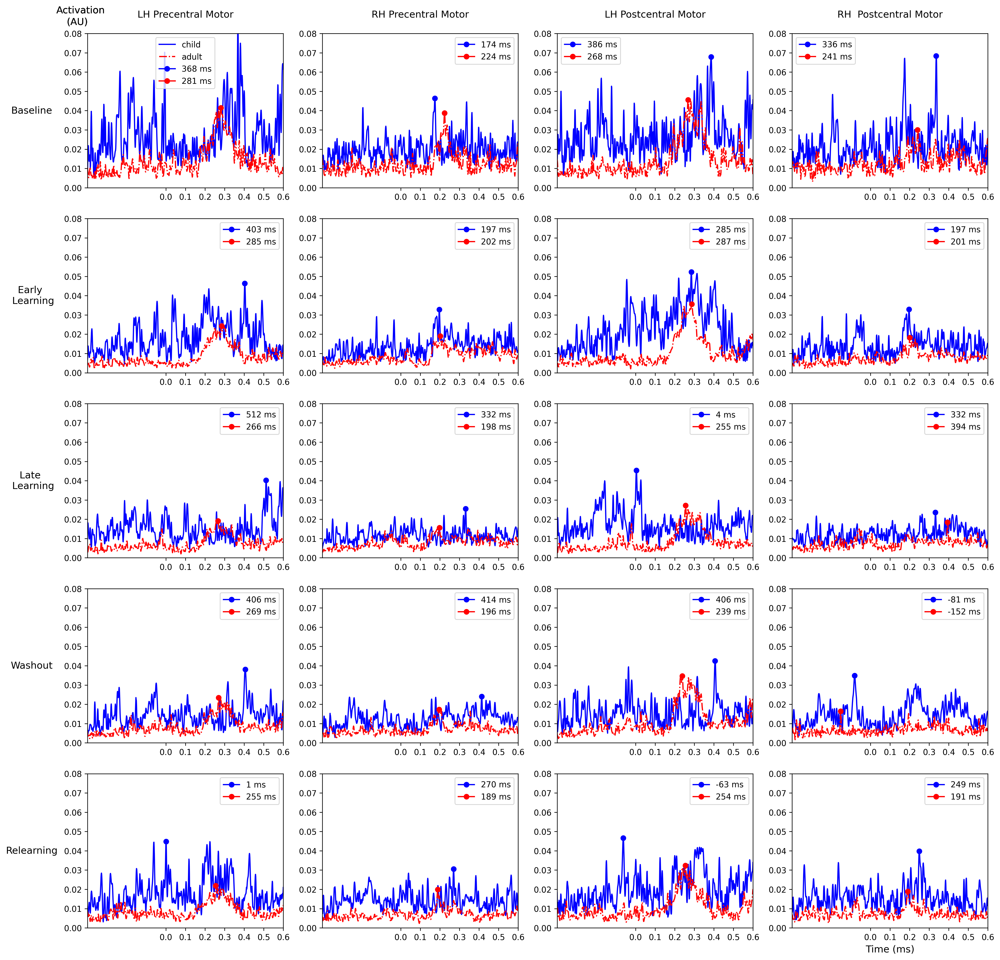

In [23]:
#Now For the Motor Regions: 
conds = ['run 1', 'run 2', 'run 3', 'run 4', 'run 5']
surf_labels = ['precentral-lh', 'precentral-rh', 'postcentral-lh', 'postcentral-rh']
child = 'vml_avg_child'
adult = 'fsaverage'

#Read in Child/Adult source spaces and generate appropriate volume/surface labels from either averaged subject
child_src = mne.read_source_spaces(op.join(mri_path, 'vml_avg_child', 'bem', 'vml_avg_child-mixed-src.fif'), verbose=False)
adult_src = mne.read_source_spaces(op.join(mri_path, 'fsaverage', 'bem', 'fsaverage-mixed-src.fif'), verbose=False)

child_vol_labels = mne.get_volume_labels_from_src(child_src, subject=child, subjects_dir=mri_path)
adult_vol_labels = mne.get_volume_labels_from_src(adult_src, subject=adult, subjects_dir=mri_path)

adult_surf_labels = mne.read_labels_from_annot(subject=adult, parc='aparc', subjects_dir=mri_path)
child_surf_labels = mne.read_labels_from_annot(subject=child, parc='aparc', subjects_dir=mri_path)
adult_surf_labels = [label for label in adult_surf_labels if label.name in surf_labels] #Keep only the labels specified in surf_labels
child_surf_labels = [label for label in child_surf_labels if label.name in surf_labels] #Keep only the labels specified in surf_labels

print('the child surface labels are', child_surf_labels)
print('the adult surface labels are', adult_surf_labels)
print('the child volume labels are', child_vol_labels)
print('the adult volume labels are', adult_vol_labels)

#[<Label | vml_avg_child, 'postcentral-lh', lh : 580 vertices>, <Label | vml_avg_child, 'postcentral-rh', rh : 583 vertices>, 
# <Label | vml_avg_child, 'precentral-lh', lh : 675 vertices>, <Label | vml_avg_child, 'precentral-rh', rh : 663 vertices>]
#[<Label | vml_avg_child, 'Cerebellum-Cortex-rh', rh : 580 vertices>, <Label | vml_avg_child, 'Cerebellum-White-Matter-rh', rh : 109 vertices>, 
# <Label | vml_avg_child, 'Cerebellum-Cortex-lh', lh : 633 vertices>, <Label | vml_avg_child, 'Cerebellum-White-Matter-lh', lh : 128 vertices>]

fig, axs = plt.subplots(len(conds), len(surf_labels), figsize=(20,20), dpi=300)

i=0
for cond in conds:

    print(cond)
    #Call in the appropriate stc files
    child_stc = mne.read_source_estimate(op.join(meg_path, f'VML_child_morphed-averaged_DS_{cond} -stc.h5'))
    adult_stc = mne.read_source_estimate(op.join(meg_path, f'VML_adult_morphed-averaged_DS_{cond} -stc.h5'))
    child_stc._data = abs(child_stc.data)
    adult_stc._data = abs(adult_stc.data)
    times = child_stc.times

    #Extract the time courses for surface labels and extract timing/max. activation values

    #Children
    child_lh_precentral_tc = mne.extract_label_time_course(child_stc, labels=child_surf_labels[2], src=child_src, mode='mean')[0]
    max_time_lh_precentral = np.argmax(child_lh_precentral_tc[:1100]) #0-600ms 
    max_active_lh_precentral = np.max(child_lh_precentral_tc[:1100])

    child_rh_precentral_tc = mne.extract_label_time_course(child_stc, labels=child_surf_labels[3], src=child_src, mode='mean')[0]
    max_time_rh_precentral = np.argmax(child_rh_precentral_tc[:1100])
    max_active_rh_precentral = np.max(child_rh_precentral_tc[:1100])

    child_lh_postcentral_tc = mne.extract_label_time_course(child_stc, labels=child_surf_labels[0], src=child_src, mode='mean')[0]
    max_time_lh_postcentral = np.argmax(child_lh_postcentral_tc[:1100])
    max_active_lh_postcentral = np.max(child_lh_postcentral_tc[:1100])

    child_rh_postcentral_tc = mne.extract_label_time_course(child_stc, labels=child_surf_labels[1], src=child_src, mode='mean')[0]
    max_time_rh_postcentral = np.argmax(child_rh_postcentral_tc[:1100])
    max_active_rh_postcentral = np.max(child_rh_postcentral_tc[:1100])

    #Adults
    adult_lh_precentral_tc = mne.extract_label_time_course(adult_stc, labels=adult_surf_labels[2], src=adult_src, mode='mean')[0]
    max_time_lh_precentral_adult = np.argmax(adult_lh_precentral_tc[:1100])
    max_active_lh_precentral_adult = np.max(adult_lh_precentral_tc[:1100])

    adult_rh_precentral_tc = mne.extract_label_time_course(adult_stc, labels=adult_surf_labels[3], src=adult_src, mode='mean')[0]
    max_time_rh_precentral_adult = np.argmax(adult_rh_precentral_tc[:1100])
    max_active_rh_precentral_adult = np.max(adult_rh_precentral_tc[:1100])


    adult_lh_postcentral_tc = mne.extract_label_time_course(adult_stc, labels=adult_surf_labels[0], src=adult_src, mode='mean')[0]
    max_time_lh_postcentral_adult = np.argmax(adult_lh_postcentral_tc[:1100])
    max_active_lh_postcentral_adult = np.max(adult_lh_postcentral_tc[:1100])

    adult_rh_postcentral_tc = mne.extract_label_time_course(adult_stc, labels=adult_surf_labels[1], src=adult_src, mode='mean')[0]
    max_time_rh_postcentral_adult = np.argmax(adult_rh_postcentral_tc[:1100])
    max_active_rh_postcentral_adult = np.max(adult_rh_postcentral_tc[:1100])


    #Plotting
    # Define titles for the columns and labels for the rows
    column_titles = ['LH Precentral Motor', 'RH Precentral Motor', 'LH Postcentral Motor', 'RH  Postcentral Motor']
    row_labels = ['Baseline', 'Early \n Learning', 'Late \n Learning', 'Washout', 'Relearning']

    # Set column titles for the top row
    for ax, col_title in zip(axs[0], column_titles):
        ax.set_title(col_title, fontsize=12, pad=20)  # 'pad' moves the title slightly above the plot

    # Set row labels for the left-most column
    for ax, row_label in zip(axs[:, 0], row_labels):
        ax.set_ylabel(row_label, fontsize=12, rotation=0, labelpad=40, va='center')  # 'va' aligns the text vertically

    # Set xlim for each subplot and show the ticks
    for ax in axs.flat:
        ax.set_xlim(-0.4, 0.6)
        ax.set_xticks([0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6])
        ax.set_yticks([0, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08])  # Example yticks, modify as needed
        ax.set_ylim(0, 0.08)

    # Add a single label for the x-axis (bottom right plot)
    axs[-1, -1].set_xlabel('Time (ms)', fontsize=12)

    # Remove duplicate labels for other subplots
    for ax in axs[:, 1:].flat:
        ax.set_ylabel('')
    for ax in axs[:-1, :].flat:
        ax.set_xlabel('')

    #if statement to only plot child/adult label once in the top left plot, then not for the rest of them
    if i == 0: 
        axs[i, 0].plot(times, child_lh_precentral_tc, label='child', color='blue')
        axs[i, 1].plot(times, child_rh_precentral_tc, color='blue')
        axs[i, 2].plot(times, child_lh_postcentral_tc, color='blue')
        axs[i, 3].plot(times, child_rh_postcentral_tc, color='blue')

        axs[i, 0].plot(times, adult_lh_precentral_tc, label='adult', color='red', linestyle='-.')
        axs[i, 1].plot(times, adult_rh_precentral_tc, color='red', linestyle='-.')
        axs[i, 2].plot(times, adult_lh_postcentral_tc, color='red', linestyle='-.')
        axs[i, 3].plot(times, adult_rh_postcentral_tc, color='red', linestyle='-.')

        #Add Maximal Activation Points
        axs[i,0].plot(child_stc.times[max_time_lh_precentral], max_active_lh_precentral, color='blue', marker='o', label=f'{int(round((child_stc.times[max_time_lh_precentral] * 1000), 0))} ms')
        axs[i,1].plot(child_stc.times[max_time_rh_precentral], max_active_rh_precentral, color='blue', marker='o', label=f'{int(round((child_stc.times[max_time_rh_precentral] * 1000), 0))} ms')
        axs[i,2].plot(child_stc.times[max_time_lh_postcentral], max_active_lh_postcentral, color='blue', marker='o', label=f'{int(round((child_stc.times[max_time_lh_postcentral] * 1000), 0))} ms')
        axs[i,3].plot(child_stc.times[max_time_rh_postcentral], max_active_rh_postcentral, color='blue', marker='o', label=f'{int(round((child_stc.times[max_time_rh_postcentral] * 1000), 0))} ms')

        axs[i,0].plot(adult_stc.times[max_time_lh_precentral_adult], max_active_lh_precentral_adult, color='red', marker='o', label=f'{int(round((adult_stc.times[max_time_lh_precentral_adult] * 1000),  0))} ms')
        axs[i,1].plot(adult_stc.times[max_time_rh_precentral_adult], max_active_rh_precentral_adult, color='red', marker='o', label=f'{int(round((adult_stc.times[max_time_rh_precentral_adult] * 1000), 0))} ms')
        axs[i,2].plot(adult_stc.times[max_time_lh_postcentral_adult], max_active_lh_postcentral_adult, color='red', marker='o', label=f'{int(round((adult_stc.times[max_time_lh_postcentral_adult] * 1000),0))} ms')
        axs[i,3].plot(adult_stc.times[max_time_rh_postcentral_adult], max_active_rh_postcentral_adult, color='red', marker='o', label=f'{int(round((adult_stc.times[max_time_rh_postcentral_adult] * 1000),0))} ms')

        axs[i,0].legend()
        axs[i,1].legend()
        axs[i,2].legend()
        axs[i,3].legend()
    else:
        axs[i, 0].plot(times, child_lh_precentral_tc, color='blue')
        axs[i, 1].plot(times, child_rh_precentral_tc, color='blue')
        axs[i, 2].plot(times, child_lh_postcentral_tc, color='blue')
        axs[i, 3].plot(times, child_rh_postcentral_tc, color='blue')

        axs[i, 0].plot(times, adult_lh_precentral_tc, color='red', linestyle='-.')
        axs[i, 1].plot(times, adult_rh_precentral_tc, color='red', linestyle='-.')
        axs[i, 2].plot(times, adult_lh_postcentral_tc, color='red', linestyle='-.')
        axs[i, 3].plot(times, adult_rh_postcentral_tc, color='red', linestyle='-.')

        #Add Maximal Activation Points
        axs[i,0].plot(child_stc.times[max_time_lh_precentral], max_active_lh_precentral, color='blue', marker='o', label=f'{int(round((child_stc.times[max_time_lh_precentral] * 1000), 0))} ms')
        axs[i,1].plot(child_stc.times[max_time_rh_precentral], max_active_rh_precentral, color='blue', marker='o', label=f'{int(round((child_stc.times[max_time_rh_precentral] * 1000), 0))} ms')
        axs[i,2].plot(child_stc.times[max_time_lh_postcentral], max_active_lh_postcentral, color='blue', marker='o', label=f'{int(round((child_stc.times[max_time_lh_postcentral] * 1000), 0))} ms')
        axs[i,3].plot(child_stc.times[max_time_rh_postcentral], max_active_rh_postcentral, color='blue', marker='o', label=f'{int(round((child_stc.times[max_time_rh_postcentral] * 1000), 0))} ms')

        axs[i,0].plot(adult_stc.times[max_time_lh_precentral_adult], max_active_lh_precentral_adult, color='red', marker='o', label=f'{int(round((adult_stc.times[max_time_lh_precentral_adult] * 1000),  0))} ms')
        axs[i,1].plot(adult_stc.times[max_time_rh_precentral_adult], max_active_rh_precentral_adult, color='red', marker='o', label=f'{int(round((adult_stc.times[max_time_rh_precentral_adult] * 1000), 0))} ms')
        axs[i,2].plot(adult_stc.times[max_time_lh_postcentral_adult], max_active_lh_postcentral_adult, color='red', marker='o', label=f'{int(round((adult_stc.times[max_time_lh_postcentral_adult] * 1000),0))} ms')
        axs[i,3].plot(adult_stc.times[max_time_rh_postcentral_adult], max_active_rh_postcentral_adult, color='red', marker='o', label=f'{int(round((adult_stc.times[max_time_rh_postcentral_adult] * 1000),0))} ms')

        axs[i,0].legend()
        axs[i,1].legend()
        axs[i,2].legend()
        axs[i,3].legend()

    fig.text(0.098, 0.90, 'Activation', va='center', rotation='horizontal', fontsize=12)
    fig.text(0.107, 0.89, '(AU)', va='center', rotation='horizontal', fontsize=12)
    i += 1

In [9]:
print(mne.read_labels_from_annot(subject=child, parc='aparc', subjects_dir=mri_path))

Reading labels from parcellation...
   read 35 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\vml_avg_child\label\lh.aparc.annot
   read 35 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\vml_avg_child\label\rh.aparc.annot
[<Label | vml_avg_child, 'bankssts-lh', lh : 121 vertices>, <Label | vml_avg_child, 'bankssts-rh', rh : 124 vertices>, <Label | vml_avg_child, 'caudalanteriorcingulate-lh', lh : 83 vertices>, <Label | vml_avg_child, 'caudalanteriorcingulate-rh', rh : 96 vertices>, <Label | vml_avg_child, 'caudalmiddlefrontal-lh', lh : 218 vertices>, <Label | vml_avg_child, 'caudalmiddlefrontal-rh', rh : 218 vertices>, <Label | vml_avg_child, 'cuneus-lh', lh : 112 vertices>, <Label | vml_avg_child, 'cuneus-rh', rh : 116 vertices>, <Label | vml_avg_child, 'entorhinal-lh', lh : 46 vertices>, <Label | vml_avg_child, 'entorhinal-rh', rh : 40 vertices>, <Label | vml_avg_child, 'frontalpole-lh', lh : 20 vertices>, <Label | vml_avg_child, 'frontalpole-rh', rh : 27 vertices>, <Label | 

Reading labels from parcellation...
   read 35 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\fsaverage\label\lh.aparc.annot
   read 34 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\fsaverage\label\rh.aparc.annot
Reading labels from parcellation...
   read 35 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\vml_avg_child\label\lh.aparc.annot
   read 35 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\vml_avg_child\label\rh.aparc.annot
the child surface labels are [<Label | vml_avg_child, 'lateraloccipital-lh', lh : 419 vertices>, <Label | vml_avg_child, 'lateraloccipital-rh', rh : 394 vertices>, <Label | vml_avg_child, 'rostralmiddlefrontal-lh', lh : 454 vertices>, <Label | vml_avg_child, 'rostralmiddlefrontal-rh', rh : 486 vertices>]
the adult surface labels are [<Label | fsaverage, 'lateraloccipital-lh', lh : 6379 vertices>, <Label | fsaverage, 'lateraloccipital-rh', rh : 5963 vertices>, <Label | fsaverage, 'rostralmiddlefrontal-lh', lh : 7243 vertices>, <Label | fsavera

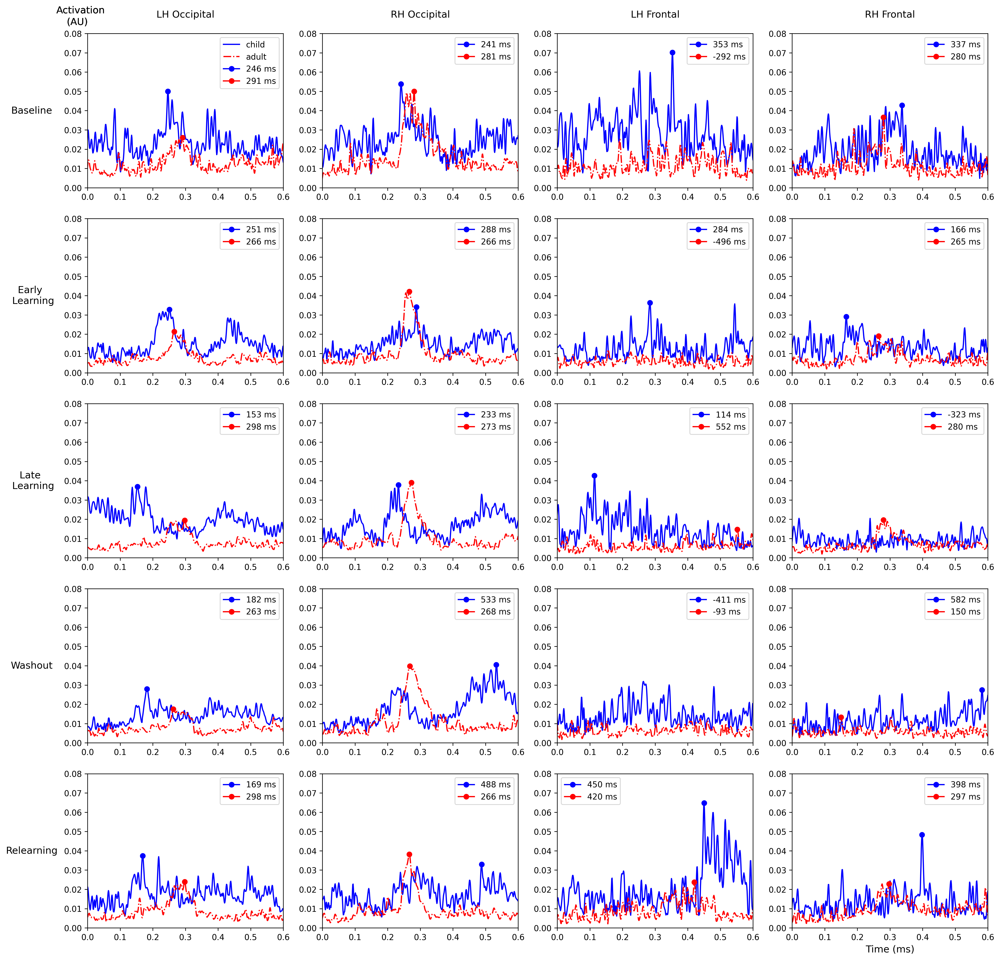

Extracting time courses for 5 labels (mode: mean_flip)
Extracting time courses for 5 labels (mode: mean_flip)
Extracting time courses for 5 labels (mode: mean_flip)
Reading labels from parcellation...
   read 18 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\fsaverage\label\lh.Yeo2011_17Networks_N1000.annot
Reading labels from parcellation...
   read 18 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\fsaverage\label\rh.Yeo2011_17Networks_N1000.annot
Extracting time courses for 5 labels (mode: mean_flip)
Extracting time courses for 5 labels (mode: mean_flip)
Extracting time courses for 5 labels (mode: mean_flip)
Reading labels from parcellation...
   read 181 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\fsaverage\label\lh.HCPMMP1.annot
Reading labels from parcellation...
   read 181 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\fsaverage\label\rh.HCPMMP1.annot
Extracting time courses for 5 labels (mode: mean_flip)
Extracting time courses for 5 labels (mode: mean_flip)


In [12]:
#Now for the frontal/visual 
conds = ['run 1', 'run 2', 'run 3', 'run 4', 'run 5']
surf_labels = ['lateraloccipital-lh', 'lateraloccipital-rh','rostralmiddlefrontal-lh', 'rostralmiddlefrontal-rh']
child = 'vml_avg_child'
adult = 'fsaverage'

#Read in Child/Adult source spaces and generate appropriate volume/surface labels from either averaged subject
child_src = mne.read_source_spaces(op.join(mri_path, 'vml_avg_child', 'bem', 'vml_avg_child-mixed-src.fif'), verbose=False)
adult_src = mne.read_source_spaces(op.join(mri_path, 'fsaverage', 'bem', 'fsaverage-mixed-src.fif'), verbose=False)

adult_surf_labels = mne.read_labels_from_annot(subject=adult, parc='aparc', subjects_dir=mri_path)
child_surf_labels = mne.read_labels_from_annot(subject=child, parc='aparc', subjects_dir=mri_path)
adult_surf_labels = [label for label in adult_surf_labels if label.name in surf_labels] #Keep only the labels specified in surf_labels
child_surf_labels = [label for label in child_surf_labels if label.name in surf_labels] #Keep only the labels specified in surf_labels

print('the child surface labels are', child_surf_labels)
print('the adult surface labels are', adult_surf_labels)

#[<Label | vml_avg_child, 'lateraloccipital-lh', lh : 419 vertices>, <Label | vml_avg_child, 'lateraloccipital-rh', rh : 394 vertices>, 
#<Label | vml_avg_child, 'rostralmiddlefrontal-lh', lh : 454 vertices>, <Label | vml_avg_child, 'rostralmiddlefrontal-rh', rh : 486 vertices>]

fig, axs = plt.subplots(len(conds), len(surf_labels), figsize=(20,20), dpi=300)

i=0
for cond in conds:

    print(cond)
    #Call in the appropriate stc files
    child_stc = mne.read_source_estimate(op.join(meg_path, f'VML_child_morphed-averaged_DS_{cond} -stc.h5'))
    adult_stc = mne.read_source_estimate(op.join(meg_path, f'VML_adult_morphed-averaged_DS_{cond} -stc.h5'))
    child_stc._data = abs(child_stc.data)
    adult_stc._data = abs(adult_stc.data)
    times = child_stc.times

    #Extract the time courses for surface labels and extract timing/max. activation values

    #Children
    child_lh_lateraloccipital_tc = mne.extract_label_time_course(child_stc, labels=child_surf_labels[0], src=child_src, mode='mean')[0]
    max_time_lh_lateraloccipital = np.argmax(child_lh_lateraloccipital_tc[:1100]) #0-600ms 
    max_active_lh_lateraloccipital = np.max(child_lh_lateraloccipital_tc[:1100])

    child_rh_lateraloccipital_tc = mne.extract_label_time_course(child_stc, labels=child_surf_labels[1], src=child_src, mode='mean')[0]
    max_time_rh_lateraloccipital = np.argmax(child_rh_lateraloccipital_tc[:1100])
    max_active_rh_lateraloccipital = np.max(child_rh_lateraloccipital_tc[:1100])

    child_lh_rostralmiddlefrontal_tc = mne.extract_label_time_course(child_stc, labels=child_surf_labels[2], src=child_src, mode='mean')[0]
    max_time_lh_rostralmiddlefrontal = np.argmax(child_lh_rostralmiddlefrontal_tc[:1100])
    max_active_lh_rostralmiddlefrontal = np.max(child_lh_rostralmiddlefrontal_tc[:1100])

    child_rh_rostralmiddlefrontal_tc = mne.extract_label_time_course(child_stc, labels=child_surf_labels[3], src=child_src, mode='mean')[0]
    max_time_rh_rostralmiddlefrontal = np.argmax(child_rh_rostralmiddlefrontal_tc[:1100])
    max_active_rh_rostralmiddlefrontal = np.max(child_rh_rostralmiddlefrontal_tc[:1100])

    #Adults
    adult_lh_lateraloccipital_tc = mne.extract_label_time_course(adult_stc, labels=adult_surf_labels[0], src=adult_src, mode='mean')[0]
    max_time_lh_lateraloccipital_adult = np.argmax(adult_lh_lateraloccipital_tc[:1100])
    max_active_lh_lateraloccipital_adult = np.max(adult_lh_lateraloccipital_tc[:1100])

    adult_rh_lateraloccipital_tc = mne.extract_label_time_course(adult_stc, labels=adult_surf_labels[1], src=adult_src, mode='mean')[0]
    max_time_rh_lateraloccipital_adult = np.argmax(adult_rh_lateraloccipital_tc[:1100])
    max_active_rh_lateraloccipital_adult = np.max(adult_rh_lateraloccipital_tc[:1100])


    adult_lh_rostralmiddlefrontal_tc = mne.extract_label_time_course(adult_stc, labels=adult_surf_labels[2], src=adult_src, mode='mean')[0]
    max_time_lh_rostralmiddlefrontal_adult = np.argmax(adult_lh_rostralmiddlefrontal_tc[:1100])
    max_active_lh_rostralmiddlefrontal_adult = np.max(adult_lh_rostralmiddlefrontal_tc[:1100])

    adult_rh_rostralmiddlefrontal_tc = mne.extract_label_time_course(adult_stc, labels=adult_surf_labels[3], src=adult_src, mode='mean')[0]
    max_time_rh_rostralmiddlefrontal_adult = np.argmax(adult_rh_rostralmiddlefrontal_tc[:1100])
    max_active_rh_rostralmiddlefrontal_adult = np.max(adult_rh_rostralmiddlefrontal_tc[:1100])

    #Plotting
    # Define titles for the columns and labels for the rows
    column_titles = ['LH Occipital', 'RH Occipital', 'LH Frontal', 'RH Frontal']
    row_labels = ['Baseline', 'Early \n Learning', 'Late \n Learning', 'Washout', 'Relearning']

    # Set column titles for the top row
    for ax, col_title in zip(axs[0], column_titles):
        ax.set_title(col_title, fontsize=12, pad=20)  # 'pad' moves the title slightly above the plot

    # Set row labels for the left-most column
    for ax, row_label in zip(axs[:, 0], row_labels):
        ax.set_ylabel(row_label, fontsize=12, rotation=0, labelpad=40, va='center')  # 'va' aligns the text vertically

    # Set xlim for each subplot and show the ticks
    for ax in axs.flat:
        ax.set_xlim(0.1, 0.6)
        ax.set_xticks([0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6])
        ax.set_yticks([0, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08])  # Example yticks, modify as needed
        ax.set_ylim(0, 0.08)

    # Add a single label for the x-axis (bottom right plot)
    axs[-1, -1].set_xlabel('Time (ms)', fontsize=12)

    # Remove duplicate labels for other subplots
    for ax in axs[:, 1:].flat:
        ax.set_ylabel('')
    for ax in axs[:-1, :].flat:
        ax.set_xlabel('')

    #if statement to only plot child/adult label once in the top left plot, then not for the rest of them
    if i == 0: 
        axs[i, 0].plot(times, child_lh_lateraloccipital_tc, label='child', color='blue')
        axs[i, 1].plot(times, child_rh_lateraloccipital_tc, color='blue')
        axs[i, 2].plot(times, child_lh_rostralmiddlefrontal_tc, color='blue')
        axs[i, 3].plot(times, child_rh_rostralmiddlefrontal_tc, color='blue')

        axs[i, 0].plot(times, adult_lh_lateraloccipital_tc, label='adult', color='red', linestyle='-.')
        axs[i, 1].plot(times, adult_rh_lateraloccipital_tc, color='red', linestyle='-.')
        axs[i, 2].plot(times, adult_lh_rostralmiddlefrontal_tc, color='red', linestyle='-.')
        axs[i, 3].plot(times, adult_rh_rostralmiddlefrontal_tc, color='red', linestyle='-.')

        #Add Maximal Activation Points
        axs[i,0].plot(child_stc.times[max_time_lh_lateraloccipital], max_active_lh_lateraloccipital, color='blue', marker='o', label=f'{int(round((child_stc.times[max_time_lh_lateraloccipital] * 1000), 0))} ms')
        axs[i,1].plot(child_stc.times[max_time_rh_lateraloccipital], max_active_rh_lateraloccipital, color='blue', marker='o', label=f'{int(round((child_stc.times[max_time_rh_lateraloccipital] * 1000), 0))} ms')
        axs[i,2].plot(child_stc.times[max_time_lh_rostralmiddlefrontal], max_active_lh_rostralmiddlefrontal, color='blue', marker='o', label=f'{int(round((child_stc.times[max_time_lh_rostralmiddlefrontal] * 1000), 0))} ms')
        axs[i,3].plot(child_stc.times[max_time_rh_rostralmiddlefrontal], max_active_rh_rostralmiddlefrontal, color='blue', marker='o', label=f'{int(round((child_stc.times[max_time_rh_rostralmiddlefrontal] * 1000), 0))} ms')

        axs[i,0].plot(adult_stc.times[max_time_lh_lateraloccipital_adult], max_active_lh_lateraloccipital_adult, color='red', marker='o', label=f'{int(round((adult_stc.times[max_time_lh_lateraloccipital_adult] * 1000),  0))} ms')
        axs[i,1].plot(adult_stc.times[max_time_rh_lateraloccipital_adult], max_active_rh_lateraloccipital_adult, color='red', marker='o', label=f'{int(round((adult_stc.times[max_time_rh_lateraloccipital_adult] * 1000), 0))} ms')
        axs[i,2].plot(adult_stc.times[max_time_lh_rostralmiddlefrontal_adult], max_active_lh_rostralmiddlefrontal_adult, color='red', marker='o', label=f'{int(round((adult_stc.times[max_time_lh_rostralmiddlefrontal_adult] * 1000),0))} ms')
        axs[i,3].plot(adult_stc.times[max_time_rh_rostralmiddlefrontal_adult], max_active_rh_rostralmiddlefrontal_adult, color='red', marker='o', label=f'{int(round((adult_stc.times[max_time_rh_rostralmiddlefrontal_adult] * 1000),0))} ms')

        axs[i,0].legend()
        axs[i,1].legend()
        axs[i,2].legend()
        axs[i,3].legend()
    else:
        axs[i, 0].plot(times, child_lh_lateraloccipital_tc, color='blue')
        axs[i, 1].plot(times, child_rh_lateraloccipital_tc, color='blue')
        axs[i, 2].plot(times, child_lh_rostralmiddlefrontal_tc, color='blue')
        axs[i, 3].plot(times, child_rh_rostralmiddlefrontal_tc, color='blue')

        axs[i, 0].plot(times, adult_lh_lateraloccipital_tc, color='red', linestyle='-.')
        axs[i, 1].plot(times, adult_rh_lateraloccipital_tc, color='red', linestyle='-.')
        axs[i, 2].plot(times, adult_lh_rostralmiddlefrontal_tc, color='red', linestyle='-.')
        axs[i, 3].plot(times, adult_rh_rostralmiddlefrontal_tc, color='red', linestyle='-.')

        #Add Maximal Activation Points
        axs[i,0].plot(child_stc.times[max_time_lh_lateraloccipital], max_active_lh_lateraloccipital, color='blue', marker='o', label=f'{int(round((child_stc.times[max_time_lh_lateraloccipital] * 1000), 0))} ms')
        axs[i,1].plot(child_stc.times[max_time_rh_lateraloccipital], max_active_rh_lateraloccipital, color='blue', marker='o', label=f'{int(round((child_stc.times[max_time_rh_lateraloccipital] * 1000), 0))} ms')
        axs[i,2].plot(child_stc.times[max_time_lh_rostralmiddlefrontal], max_active_lh_rostralmiddlefrontal, color='blue', marker='o', label=f'{int(round((child_stc.times[max_time_lh_rostralmiddlefrontal] * 1000), 0))} ms')
        axs[i,3].plot(child_stc.times[max_time_rh_rostralmiddlefrontal], max_active_rh_rostralmiddlefrontal, color='blue', marker='o', label=f'{int(round((child_stc.times[max_time_rh_rostralmiddlefrontal] * 1000), 0))} ms')

        axs[i,0].plot(adult_stc.times[max_time_lh_lateraloccipital_adult], max_active_lh_lateraloccipital_adult, color='red', marker='o', label=f'{int(round((adult_stc.times[max_time_lh_lateraloccipital_adult] * 1000),  0))} ms')
        axs[i,1].plot(adult_stc.times[max_time_rh_lateraloccipital_adult], max_active_rh_lateraloccipital_adult, color='red', marker='o', label=f'{int(round((adult_stc.times[max_time_rh_lateraloccipital_adult] * 1000), 0))} ms')
        axs[i,2].plot(adult_stc.times[max_time_lh_rostralmiddlefrontal_adult], max_active_lh_rostralmiddlefrontal_adult, color='red', marker='o', label=f'{int(round((adult_stc.times[max_time_lh_rostralmiddlefrontal_adult] * 1000),0))} ms')
        axs[i,3].plot(adult_stc.times[max_time_rh_rostralmiddlefrontal_adult], max_active_rh_rostralmiddlefrontal_adult, color='red', marker='o', label=f'{int(round((adult_stc.times[max_time_rh_rostralmiddlefrontal_adult] * 1000),0))} ms')

        axs[i,0].legend()
        axs[i,1].legend()
        axs[i,2].legend()
        axs[i,3].legend()

    fig.text(0.098, 0.90, 'Activation', va='center', rotation='horizontal', fontsize=12)
    fig.text(0.107, 0.89, '(AU)', va='center', rotation='horizontal', fontsize=12)
    i += 1

In [22]:
print(adult_src)
print(child_src)

<SourceSpaces: [<surface (lh), n_vertices=163842, n_used=10242>, <surface (rh), n_vertices=163842, n_used=10242>, <volume (Right-Cerebellum-Cortex), n_used=482>, <volume (Right-Cerebellum-White-Matter), n_used=104>, <volume (Left-Cerebellum-Cortex), n_used=510>, <volume (Left-Cerebellum-White-Matter), n_used=103>] MRI (surface RAS) coords, subject 'fsaverage', ~322.6 MB>
<SourceSpaces: [<surface (lh), n_vertices=10242, n_used=4098>, <surface (rh), n_vertices=10242, n_used=4098>, <volume (Right-Cerebellum-Cortex), n_used=580>, <volume (Right-Cerebellum-White-Matter), n_used=109>, <volume (Left-Cerebellum-Cortex), n_used=633>, <volume (Left-Cerebellum-White-Matter), n_used=128>] MRI (surface RAS) coords, subject 'vml_avg_child', ~303.5 MB>


In [344]:
print(child_vol_labels)

[<Label | vml_avg_child, 'Cerebellum-Cortex-rh', rh : 580 vertices>, <Label | vml_avg_child, 'Cerebellum-White-Matter-rh', rh : 109 vertices>, <Label | vml_avg_child, 'Cerebellum-Cortex-lh', lh : 633 vertices>, <Label | vml_avg_child, 'Cerebellum-White-Matter-lh', lh : 128 vertices>]


In [ ]:
child_stc = mne.read_source_estimate(op.join(meg_path, f'VML_child_morphed-averaged_DS_run 2 -stc.h5'))

tc = mne.extract_label_time_course(child_stc, src=child_src, labels=child_vol_labels)#Extract every time course

tc1 = mne.extract_label_time_course(child_stc, src=child_src, labels=child_vol_labels[3])#cerebellum cortex rh 

cerebellar_volume_tcs = mne.extract_label_time_course(child_stc, src=child_src, labels=child_vol_labels)[:4]
print(cerebellar_volume_tcs)
print(np.mean((cerebellar_volume_tcs[0], cerebellar_volume_tcs[1]), axis=0))
print((cerebellar_volume_tcs[0][2] + cerebellar_volume_tcs[1][2]) / 2)

plt.plot(child_stc.times, np.mean((cerebellar_volume_tcs[0], cerebellar_volume_tcs[1]), axis=0), label='rh cerebellum')
plt.plot(child_stc.times, np.mean((cerebellar_volume_tcs[2], cerebellar_volume_tcs[3]), axis=0), label='lh cerebellum')

plt.legend()

Reading labels from parcellation...
   read 35 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\fsaverage\label\lh.aparc.annot
   read 34 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\fsaverage\label\rh.aparc.annot
Reading labels from parcellation...
   read 35 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\vml_avg_child\label\lh.aparc.annot
   read 35 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\vml_avg_child\label\rh.aparc.annot
the child surface labels are [<Label | vml_avg_child, 'superiorfrontal-lh', lh : 786 vertices>, <Label | vml_avg_child, 'superiorfrontal-rh', rh : 748 vertices>]
the child volume labels are [<Label | vml_avg_child, 'Cerebellum-Cortex-rh', rh : 580 vertices>, <Label | vml_avg_child, 'Cerebellum-White-Matter-rh', rh : 109 vertices>, <Label | vml_avg_child, 'Cerebellum-Cortex-lh', lh : 633 vertices>, <Label | vml_avg_child, 'Cerebellum-White-Matter-lh', lh : 128 vertices>]
[<Label | fsaverage, 'superiorfrontal-lh', lh : 12179 vertices>, <Label |

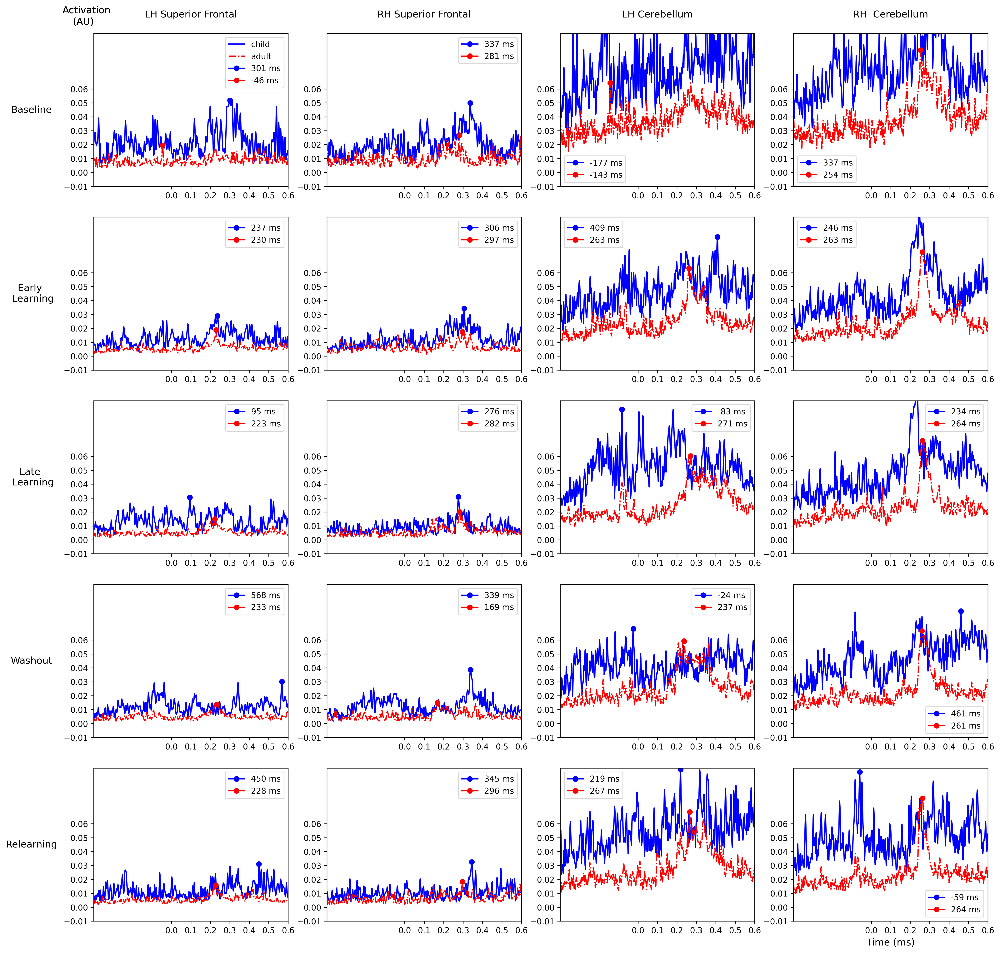

Using control points [0.03628418 0.04077733 0.05978661]
Using control points [0.03628418 0.04077733 0.05978661]


In [24]:
#Lets do the same things for the cerebellar and prefrontal regions: 
#Now For the Motor Regions: 
conds = ['run 1', 'run 2', 'run 3', 'run 4', 'run 5']
surf_labels = ['superiorfrontal-lh', 'superiorfrontal-rh']
child = 'vml_avg_child'
adult = 'fsaverage'

#Read in Child/Adult source spaces and generate appropriate volume/surface labels from either averaged subject
child_src = mne.read_source_spaces(op.join(mri_path, 'vml_avg_child', 'bem', 'vml_avg_child-mixed-src.fif'), verbose=False)
adult_src = mne.read_source_spaces(op.join(mri_path, 'fsaverage', 'bem', 'fsaverage-mixed-src.fif'), verbose=False)

child_vol_labels = mne.get_volume_labels_from_src(child_src, subject=child, subjects_dir=mri_path)
adult_vol_labels = mne.get_volume_labels_from_src(adult_src, subject=adult, subjects_dir=mri_path)

adult_surf_labels = mne.read_labels_from_annot(subject=adult, parc='aparc', subjects_dir=mri_path)
child_surf_labels = mne.read_labels_from_annot(subject=child, parc='aparc', subjects_dir=mri_path)
adult_surf_labels = [label for label in adult_surf_labels if label.name in surf_labels] #Keep only the labels specified in surf_labels
child_surf_labels = [label for label in child_surf_labels if label.name in surf_labels] #Keep only the labels specified in surf_labels

print('the child surface labels are', child_surf_labels)
print('the child volume labels are', child_vol_labels)
print(adult_surf_labels)

fig, axs = plt.subplots(len(conds), int(len(surf_labels) + (len(adult_vol_labels)/2)), figsize=(20,20), dpi=300)

i=0
for cond in conds:

    print(cond)
    #Call in the appropriate stc files
    child_stc = mne.read_source_estimate(op.join(meg_path, f'VML_child_morphed-averaged_DS_{cond} -stc.h5'))
    adult_stc = mne.read_source_estimate(op.join(meg_path, f'VML_adult_morphed-averaged_DS_{cond} -stc.h5'))
    child_stc._data = abs(child_stc.data)
    adult_stc._data = abs(adult_stc.data)
    times = child_stc.times

    #Extract the time courses for surface labels and extract timing/max. activation values

    #Child Frontal
    child_lh_superiorfrontal_tc = mne.extract_label_time_course(child_stc, labels=child_surf_labels[0], src=child_src, mode='mean')[0] #LH Superior Frontal
    max_time_lh_superiorfrontal = np.argmax(child_lh_superiorfrontal_tc[:1100]) #0-600ms 
    max_active_lh_superiorfrontal = np.max(child_lh_superiorfrontal_tc[:1100])

    child_rh_superiorfrontal_tc = mne.extract_label_time_course(child_stc, labels=child_surf_labels[1], src=child_src, mode='mean')[0] #RH Superior Frontal
    max_time_rh_superiorfrontal = np.argmax(child_rh_superiorfrontal_tc[:1100]) #0-600ms 
    max_active_rh_superiorfrontal = np.max(child_rh_superiorfrontal_tc[:1100])

    #Child Cerebellum
    child_cerebellar_volume_tcs = mne.extract_label_time_course(child_stc, src=child_src, labels=child_vol_labels, mode='max')[:4]
    print(child_cerebellar_volume_tcs)

    child_rh_cerebellum_tc = ((child_cerebellar_volume_tcs[0]))
    max_time_rh_cerebellum = np.argmax(child_rh_cerebellum_tc[:1100])
    max_active_rh_cerebellum = np.max(child_rh_cerebellum_tc[:1100])


    #child_lh_cerebellum_tc = np.mean((child_cerebellar_volume_tcs[2], child_cerebellar_volume_tcs[3]), axis=0)
    child_lh_cerebellum_tc = ((child_cerebellar_volume_tcs[2]))
    max_time_lh_cerebellum = np.argmax(child_lh_cerebellum_tc[:1100])
    max_active_lh_cerebellum = np.max(child_lh_cerebellum_tc[:1100])

    # print(child_rh_cerebellum_tc)
    # print(child_lh_cerebellum_tc)

    #Adult Frontal
    adult_lh_superiorfrontal_tc = mne.extract_label_time_course(adult_stc, labels=adult_surf_labels[0], src=adult_src, mode='mean')[0] #LH Superior Frontal
    max_time_lh_superiorfrontal_adult = np.argmax(adult_lh_superiorfrontal_tc[:1100]) #0-600ms 
    max_active_lh_superiorfrontal_adult = np.max(adult_lh_superiorfrontal_tc[:1100])

    adult_rh_superiorfrontal_tc = mne.extract_label_time_course(adult_stc, labels=adult_surf_labels[1], src=adult_src, mode='mean')[0] #RH Superior Frontal
    max_time_rh_superiorfrontal_adult = np.argmax(adult_rh_superiorfrontal_tc[:1100]) #0-600ms 
    max_active_rh_superiorfrontal_adult = np.max(adult_rh_superiorfrontal_tc[:1100])

    #Adult Cerebellum
    adult_cerebellar_volume_tcs = mne.extract_label_time_course(adult_stc, src=adult_src, labels=adult_vol_labels, mode='max')[:4]

    adult_rh_cerebellum_tc = ((adult_cerebellar_volume_tcs[0]))
    max_time_rh_cerebellum_adult = np.argmax(adult_rh_cerebellum_tc[:1100])
    max_active_rh_cerebellum_adult = np.max(adult_rh_cerebellum_tc[:1100])

    adult_lh_cerebellum_tc = (adult_cerebellar_volume_tcs[2])
    max_time_lh_cerebellum_adult = np.argmax(adult_lh_cerebellum_tc[:1100])
    max_active_lh_cerebellum_adult = np.max(adult_lh_cerebellum_tc[:1100])

    #Plotting
    # Define titles for the columns and labels for the rows
    column_titles = ['LH Superior Frontal', 'RH Superior Frontal', 'LH Cerebellum', 'RH  Cerebellum']
    row_labels = ['Baseline', 'Early \n Learning', 'Late \n Learning', 'Washout', 'Relearning']

    # Set column titles for the top row
    for ax, col_title in zip(axs[0], column_titles):
        ax.set_title(col_title, fontsize=12, pad=20)  # 'pad' moves the title slightly above the plot

    # Set row labels for the left-most column
    for ax, row_label in zip(axs[:, 0], row_labels):
        ax.set_ylabel(row_label, fontsize=12, rotation=0, labelpad=40, va='center')  # 'va' aligns the text vertically

    # Set xlim for each subplot and show the ticks
    for ax in axs.flat:
        ax.set_xlim(-0.4,0.6)
        ax.set_xticks([0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6])
        ax.set_yticks([-0.01, 0, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06])  # Example yticks, modify as needed
        ax.set_ylim(-0.01, 0.1)

    # Add a single label for the x-axis (bottom right plot)
    axs[-1, -1].set_xlabel('Time (ms)', fontsize=12)

    # Remove duplicate labels for other subplots
    for ax in axs[:, 1:].flat:
        ax.set_ylabel('')
    for ax in axs[:-1, :].flat:
        ax.set_xlabel('')

    #if statement to only plot child/adult label once in the top left plot, then not for the rest of them
    if i == 0: 
        axs[i, 0].plot(times, child_lh_superiorfrontal_tc, label='child', color='blue')
        axs[i, 1].plot(times, child_rh_superiorfrontal_tc, color='blue')
        axs[i, 2].plot(times, child_lh_cerebellum_tc, color='blue')
        axs[i, 3].plot(times, child_rh_cerebellum_tc, color='blue')

        axs[i, 0].plot(times, adult_lh_superiorfrontal_tc, label='adult', color='red', linestyle='-.')
        axs[i, 1].plot(times, adult_rh_superiorfrontal_tc, color='red', linestyle='-.')
        axs[i, 2].plot(times, adult_lh_cerebellum_tc, color='red', linestyle='-.')
        axs[i, 3].plot(times, adult_rh_cerebellum_tc, color='red', linestyle='-.')

        #Add Maximal Activation Points
        axs[i,0].plot(child_stc.times[max_time_lh_superiorfrontal], max_active_lh_superiorfrontal, color='blue', marker='o', label=f'{int(round((child_stc.times[max_time_lh_superiorfrontal] * 1000), 0))} ms')
        axs[i,1].plot(child_stc.times[max_time_rh_superiorfrontal], max_active_rh_superiorfrontal, color='blue', marker='o', label=f'{int(round((child_stc.times[max_time_rh_superiorfrontal] * 1000), 0))} ms')
        axs[i,2].plot(child_stc.times[max_time_lh_cerebellum], max_active_lh_cerebellum, color='blue', marker='o', label=f'{int(round((child_stc.times[max_time_lh_cerebellum] * 1000), 0))} ms')
        axs[i,3].plot(child_stc.times[max_time_rh_cerebellum], max_active_rh_cerebellum, color='blue', marker='o', label=f'{int(round((child_stc.times[max_time_rh_cerebellum] * 1000), 0))} ms')

        axs[i,0].plot(adult_stc.times[max_time_lh_superiorfrontal_adult], max_active_lh_superiorfrontal_adult, color='red', marker='o', label=f'{int(round((adult_stc.times[max_time_lh_superiorfrontal_adult] * 1000),  0))} ms')
        axs[i,1].plot(adult_stc.times[max_time_rh_superiorfrontal_adult], max_active_rh_superiorfrontal_adult, color='red', marker='o', label=f'{int(round((adult_stc.times[max_time_rh_superiorfrontal_adult] * 1000), 0))} ms')
        axs[i,2].plot(adult_stc.times[max_time_lh_cerebellum_adult], max_active_lh_cerebellum_adult, color='red', marker='o', label=f'{int(round((adult_stc.times[max_time_lh_cerebellum_adult] * 1000),0))} ms')
        axs[i,3].plot(adult_stc.times[max_time_rh_cerebellum_adult], max_active_rh_cerebellum_adult, color='red', marker='o', label=f'{int(round((adult_stc.times[max_time_rh_cerebellum_adult] * 1000),0))} ms')

        axs[i,0].legend()
        axs[i,1].legend()
        axs[i,2].legend()
        axs[i,3].legend()
    else:
        axs[i, 0].plot(times, child_lh_superiorfrontal_tc, color='blue')
        axs[i, 1].plot(times, child_rh_superiorfrontal_tc, color='blue')
        axs[i, 2].plot(times, child_lh_cerebellum_tc, color='blue')
        axs[i, 3].plot(times, child_rh_cerebellum_tc, color='blue')

        axs[i, 0].plot(times, adult_lh_superiorfrontal_tc, color='red', linestyle='-.')
        axs[i, 1].plot(times, adult_rh_superiorfrontal_tc, color='red', linestyle='-.')
        axs[i, 2].plot(times, adult_lh_cerebellum_tc, color='red', linestyle='-.')
        axs[i, 3].plot(times, adult_rh_cerebellum_tc, color='red', linestyle='-.')

        #Add Maximal Activation Points
        axs[i,0].plot(child_stc.times[max_time_lh_superiorfrontal], max_active_lh_superiorfrontal, color='blue', marker='o', label=f'{int(round((child_stc.times[max_time_lh_superiorfrontal] * 1000), 0))} ms')
        axs[i,1].plot(child_stc.times[max_time_rh_superiorfrontal], max_active_rh_superiorfrontal, color='blue', marker='o', label=f'{int(round((child_stc.times[max_time_rh_superiorfrontal] * 1000), 0))} ms')
        axs[i,2].plot(child_stc.times[max_time_lh_cerebellum], max_active_lh_cerebellum, color='blue', marker='o', label=f'{int(round((child_stc.times[max_time_lh_cerebellum] * 1000), 0))} ms')
        axs[i,3].plot(child_stc.times[max_time_rh_cerebellum], max_active_rh_cerebellum, color='blue', marker='o', label=f'{int(round((child_stc.times[max_time_rh_cerebellum] * 1000), 0))} ms')

        axs[i,0].plot(adult_stc.times[max_time_lh_superiorfrontal_adult], max_active_lh_superiorfrontal_adult, color='red', marker='o', label=f'{int(round((adult_stc.times[max_time_lh_superiorfrontal_adult] * 1000),  0))} ms')
        axs[i,1].plot(adult_stc.times[max_time_rh_superiorfrontal_adult], max_active_rh_superiorfrontal_adult, color='red', marker='o', label=f'{int(round((adult_stc.times[max_time_rh_superiorfrontal_adult] * 1000), 0))} ms')
        axs[i,2].plot(adult_stc.times[max_time_lh_cerebellum_adult], max_active_lh_cerebellum_adult, color='red', marker='o', label=f'{int(round((adult_stc.times[max_time_lh_cerebellum_adult] * 1000),0))} ms')
        axs[i,3].plot(adult_stc.times[max_time_rh_cerebellum_adult], max_active_rh_cerebellum_adult, color='red', marker='o', label=f'{int(round((adult_stc.times[max_time_rh_cerebellum_adult] * 1000),0))} ms')

        axs[i,0].legend()
        axs[i,1].legend()
        axs[i,2].legend()
        axs[i,3].legend()
    fig.text(0.098, 0.90, 'Activation', va='center', rotation='horizontal', fontsize=12)
    fig.text(0.107, 0.89, '(AU)', va='center', rotation='horizontal', fontsize=12)
    i += 1

In [28]:
print(new_times)

[-500. -499. -498. ... 1198. 1199. 1200.]


Extracting time courses for 8 labels (mode: max)
Extracting time courses for 8 labels (mode: max)
Extracting time courses for 8 labels (mode: max)
Extracting time courses for 8 labels (mode: max)
Extracting time courses for 8 labels (mode: max)
Extracting time courses for 8 labels (mode: max)


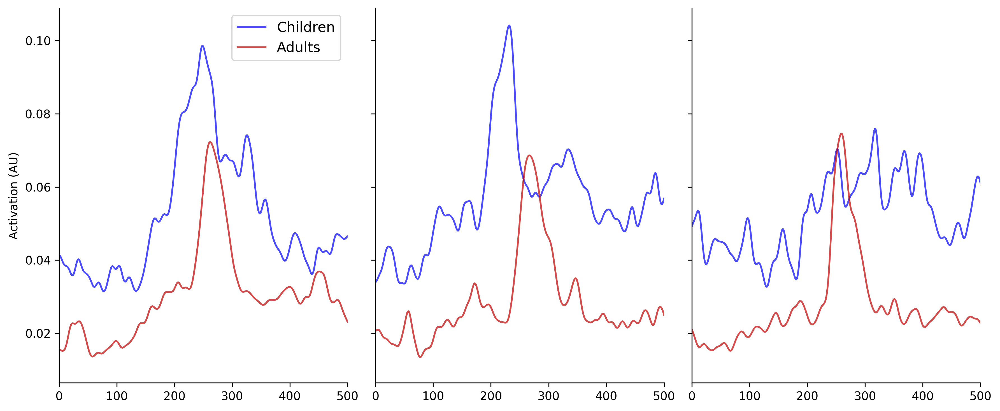

In [35]:
from scipy.ndimage import gaussian_filter1d

fig, axs = plt.subplots(1, 3, figsize=(12, 5), dpi=300, sharey=True)
new_times = times * 1000

# Iterate over conditions to plot
for i, cond in enumerate(conds):
    # Call in the appropriate stc files
    child_stc = mne.read_source_estimate(op.join(meg_path, f'VML_child_morphed-averaged_DS_{cond} -stc.h5'))
    adult_stc = mne.read_source_estimate(op.join(meg_path, f'VML_adult_morphed-averaged_DS_{cond} -stc.h5'))
    
    child_stc._data = abs(child_stc.data)
    adult_stc._data = abs(adult_stc.data)
    times = child_stc.times

    # Extract cerebellar right hemisphere timecourses
    child_rh_cerebellum_tc = mne.extract_label_time_course(child_stc, src=child_src, labels=child_vol_labels, mode='max')[0]
    adult_rh_cerebellum_tc = mne.extract_label_time_course(adult_stc, src=adult_src, labels=adult_vol_labels, mode='max')[0]

    # Smooth the timecourses with a Gaussian filter  
    sigma = 5  # Adjust sigma for more or less smoothing
    child_rh_cerebellum_tc_smooth = gaussian_filter1d(child_rh_cerebellum_tc, sigma=sigma)
    adult_rh_cerebellum_tc_smooth = gaussian_filter1d(adult_rh_cerebellum_tc, sigma=sigma)

    # Plot timecourses for the current condition
    axs[i].plot(new_times, child_rh_cerebellum_tc_smooth, label='Children', color='blue', alpha=0.7)
    axs[i].plot(new_times, adult_rh_cerebellum_tc_smooth, label='Adults', color='#C00000', alpha=0.7)

    # Remove top and right black lines (spines)
    axs[i].spines['top'].set_visible(False)
    axs[i].spines['right'].set_visible(False)

    # Set titles and labels for each subplot
    axs[i].set_xlim(0, 500)

# Set shared y-axis label
axs[0].set_ylabel('Activation (AU)', fontsize=10)
axs[0].legend(fontsize=12)

# Adjust layout
plt.tight_layout()
plt.show()


In [41]:
#Read in Child/Adult source spaces and generate appropriate volume/surface labels from either averaged subject
child_src = mne.read_source_spaces(op.join(mri_path, 'vml_avg_child', 'bem', 'vml_avg_child-mixed-src.fif'), verbose=False)
adult_src = mne.read_source_spaces(op.join(mri_path, 'fsaverage', 'bem', 'fsaverage-mixed-src.fif'), verbose=False)

child_vol_labels = mne.get_volume_labels_from_src(child_src, subject=child, subjects_dir=mri_path)
adult_vol_labels = mne.get_volume_labels_from_src(adult_src, subject=adult, subjects_dir=mri_path)

adult_surf_labels = mne.read_labels_from_annot(subject=adult, parc='aparc', subjects_dir=mri_path)
child_surf_labels = mne.read_labels_from_annot(subject=child, parc='aparc', subjects_dir=mri_path)
adult_surf_labels = [label for label in adult_surf_labels if label.name in surf_labels] #Keep only the labels specified in surf_labels
child_surf_labels = [label for label in child_surf_labels if label.name in surf_labels] #Keep only the labels specified in surf_labels

print(child_surf_labels)

Reading labels from parcellation...
   read 35 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\fsaverage\label\lh.aparc.annot
   read 34 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\fsaverage\label\rh.aparc.annot
Reading labels from parcellation...
   read 35 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\vml_avg_child\label\lh.aparc.annot
   read 35 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\vml_avg_child\label\rh.aparc.annot
[<Label | vml_avg_child, 'lateraloccipital-rh', rh : 394 vertices>]


Reading labels from parcellation...
   read 35 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\fsaverage\label\lh.aparc.annot
   read 34 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\fsaverage\label\rh.aparc.annot
Reading labels from parcellation...
   read 35 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\vml_avg_child\label\lh.aparc.annot
   read 35 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\vml_avg_child\label\rh.aparc.annot
Extracting time courses for 5 labels (mode: max)
Extracting time courses for 8 labels (mode: max)


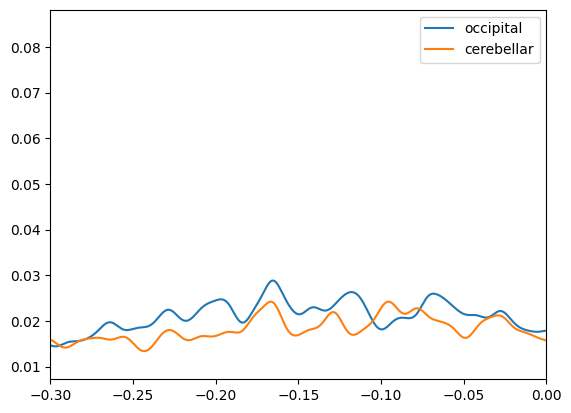

In [88]:
#Lets Sepparate occipital and cerebellar signals: 
adult_stc = mne.read_source_estimate(op.join(meg_path, f'VML_adult_morphed-averaged_DS_run 2 -stc.h5'))
conds = ['run 1', 'run 2', 'run 3', 'run 4', 'run 5']
child = 'vml_avg_child'
adult = 'fsaverage'
surf_labels = ['lateraloccipital-rh']

#Read in Child/Adult source spaces and generate appropriate volume/surface labels from either averaged subject
child_src = mne.read_source_spaces(op.join(mri_path, 'vml_avg_child', 'bem', 'vml_avg_child-mixed-src.fif'), verbose=False)
adult_src = mne.read_source_spaces(op.join(mri_path, 'fsaverage', 'bem', 'fsaverage-mixed-src.fif'), verbose=False)

child_vol_labels = mne.get_volume_labels_from_src(child_src, subject=child, subjects_dir=mri_path)
adult_vol_labels = mne.get_volume_labels_from_src(adult_src, subject=adult, subjects_dir=mri_path)

adult_surf_labels = mne.read_labels_from_annot(subject=adult, parc='aparc', subjects_dir=mri_path)
child_surf_labels = mne.read_labels_from_annot(subject=child, parc='aparc', subjects_dir=mri_path)
adult_surf_labels = [label for label in adult_surf_labels if label.name in surf_labels] #Keep only the labels specified in surf_labels
child_surf_labels = [label for label in child_surf_labels if label.name in surf_labels] #Keep only the labels specified in surf_labels

#Rh Occipital
adult_rh_lateraloccipital_tc = mne.extract_label_time_course(adult_stc, labels=adult_surf_labels, src=adult_src, mode='max')[0]
adult_rh_lateraloccipital_tc = np.abs(adult_rh_lateraloccipital_tc)

#Rh Cerebellum 
adult_cerebellar_volume_tcs = mne.extract_label_time_course(adult_stc, src=adult_src, labels=adult_vol_labels, mode='max')[:4]
adult_rh_cerebellum_tc = ((adult_cerebellar_volume_tcs[0]))

#Smoothing
sigma = 5  # Adjust sigma for more or less smoothing
adult_rh_lateraloccipital_tc_smooth = gaussian_filter1d(adult_rh_lateraloccipital_tc, sigma=sigma)
adult_rh_cerebellum_tc_smooth = gaussian_filter1d(adult_rh_cerebellum_tc, sigma=sigma)

plt.plot(adult_stc.times, adult_rh_lateraloccipital_tc_smooth, label='occipital')
plt.plot(adult_stc.times, adult_rh_cerebellum_tc_smooth, label='cerebellar')
plt.xlim(-0.3,0)
plt.legend()

Reading labels from parcellation...
   read 35 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\fsaverage\label\lh.aparc.annot
   read 34 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\fsaverage\label\rh.aparc.annot
Reading labels from parcellation...
   read 35 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\vml_avg_child\label\lh.aparc.annot
   read 35 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\vml_avg_child\label\rh.aparc.annot
Extracting time courses for 5 labels (mode: max)
Extracting time courses for 8 labels (mode: max)


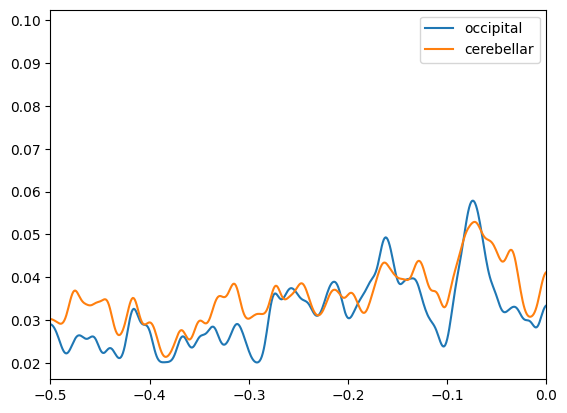

In [89]:
#Lets Sepparate occipital and cerebellar signals: 
child_stc = mne.read_source_estimate(op.join(meg_path, f'VML_child_morphed-averaged_DS_run 2 -stc.h5'))

conds = ['run 1', 'run 2', 'run 3', 'run 4', 'run 5']
child = 'vml_avg_child'
adult = 'fsaverage'
surf_labels = ['lateraloccipital-rh']

#Read in Child/Adult source spaces and generate appropriate volume/surface labels from either averaged subject
child_src = mne.read_source_spaces(op.join(mri_path, 'vml_avg_child', 'bem', 'vml_avg_child-mixed-src.fif'), verbose=False)
adult_src = mne.read_source_spaces(op.join(mri_path, 'fsaverage', 'bem', 'fsaverage-mixed-src.fif'), verbose=False)

child_vol_labels = mne.get_volume_labels_from_src(child_src, subject=child, subjects_dir=mri_path)
adult_vol_labels = mne.get_volume_labels_from_src(adult_src, subject=adult, subjects_dir=mri_path)

adult_surf_labels = mne.read_labels_from_annot(subject=adult, parc='aparc', subjects_dir=mri_path)
child_surf_labels = mne.read_labels_from_annot(subject=child, parc='aparc', subjects_dir=mri_path)
adult_surf_labels = [label for label in adult_surf_labels if label.name in surf_labels] #Keep only the labels specified in surf_labels
child_surf_labels = [label for label in child_surf_labels if label.name in surf_labels] #Keep only the labels specified in surf_labels

#Rh Occipital
child_rh_lateraloccipital_tc = mne.extract_label_time_course(child_stc, labels=child_surf_labels, src=child_src, mode='max')[0]
child_rh_lateraloccipital_tc = np.abs(child_rh_lateraloccipital_tc)

#Rh Cerebellum 
child_cerebellar_volume_tcs = mne.extract_label_time_course(child_stc, src=child_src, labels=child_vol_labels, mode='max')[:4]
child_rh_cerebellum_tc = ((child_cerebellar_volume_tcs[0]))

#Smoothing
sigma = 5  # Adjust sigma for more or less smoothing
child_rh_lateraloccipital_tc_smooth = gaussian_filter1d(child_rh_lateraloccipital_tc, sigma=sigma)
child_rh_cerebellum_tc_smooth = gaussian_filter1d(child_rh_cerebellum_tc, sigma=sigma)

plt.plot(child_stc.times,child_rh_lateraloccipital_tc_smooth, label='occipital')
plt.plot(child_stc.times,child_rh_cerebellum_tc_smooth, label='cerebellar')
plt.xlim(-0.5,0)
plt.legend()

Reading labels from parcellation...
   read 35 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\fsaverage\label\lh.aparc.annot
   read 34 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\fsaverage\label\rh.aparc.annot
Reading labels from parcellation...
   read 35 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\vml_avg_child\label\lh.aparc.annot
   read 35 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\vml_avg_child\label\rh.aparc.annot
the child surface labels are [<Label | vml_avg_child, 'superiorfrontal-lh', lh : 786 vertices>, <Label | vml_avg_child, 'superiorfrontal-rh', rh : 748 vertices>]
the child volume labels are [<Label | vml_avg_child, 'Cerebellum-Cortex-rh', rh : 580 vertices>, <Label | vml_avg_child, 'Cerebellum-White-Matter-rh', rh : 109 vertices>, <Label | vml_avg_child, 'Cerebellum-Cortex-lh', lh : 633 vertices>, <Label | vml_avg_child, 'Cerebellum-White-Matter-lh', lh : 128 vertices>]
[<Label | fsaverage, 'superiorfrontal-lh', lh : 12179 vertices>, <Label |

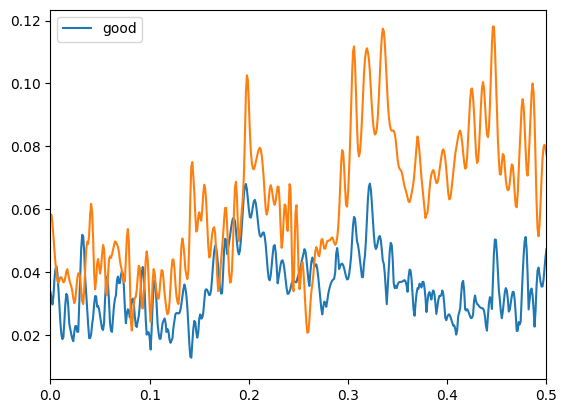

Reading labels from parcellation...
   read 35 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\fsaverage\label\lh.aparc.annot
Reading labels from parcellation...
   read 34 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\fsaverage\label\rh.aparc.annot
Extracting time courses for 5 labels (mode: mean_flip)
Extracting time courses for 5 labels (mode: mean_flip)
Extracting time courses for 5 labels (mode: mean_flip)
Reading labels from parcellation...
   read 35 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\vml_avg_child\label\lh.aparc.annot
Reading labels from parcellation...
   read 35 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\vml_avg_child\label\rh.aparc.annot
Extracting time courses for 5 labels (mode: mean_flip)
Extracting time courses for 5 labels (mode: mean_flip)


In [77]:
conds = ['run 1', 'run 2', 'run 3', 'run 4', 'run 5']
surf_labels = ['superiorfrontal-lh', 'superiorfrontal-rh']
child = 'vml_avg_child'
adult = 'fsaverage'

#Read in Child/Adult source spaces and generate appropriate volume/surface labels from either averaged subject
child_src = mne.read_source_spaces(op.join(mri_path, 'vml_avg_child', 'bem', 'vml_avg_child-mixed-src.fif'), verbose=False)
adult_src = mne.read_source_spaces(op.join(mri_path, 'fsaverage', 'bem', 'fsaverage-mixed-src.fif'), verbose=False)

child_vol_labels = mne.get_volume_labels_from_src(child_src, subject=child, subjects_dir=mri_path)
adult_vol_labels = mne.get_volume_labels_from_src(adult_src, subject=adult, subjects_dir=mri_path)

adult_surf_labels = mne.read_labels_from_annot(subject=adult, parc='aparc', subjects_dir=mri_path)
child_surf_labels = mne.read_labels_from_annot(subject=child, parc='aparc', subjects_dir=mri_path)
adult_surf_labels = [label for label in adult_surf_labels if label.name in surf_labels] #Keep only the labels specified in surf_labels
child_surf_labels = [label for label in child_surf_labels if label.name in surf_labels] #Keep only the labels specified in surf_labels

print('the child surface labels are', child_surf_labels)
print('the child volume labels are', child_vol_labels)
print(adult_surf_labels)

#Call in the appropriate stc files
child_stc = mne.read_source_estimate(op.join(meg_path, f'VML_child_morphed-averaged_DS_run 2 -stc.h5'))
adult_stc = mne.read_source_estimate(op.join(meg_path, f'VML_adult_morphed-averaged_DS_run 2 -stc.h5'))
child_stc._data = abs(child_stc.data)
adult_stc._data = abs(adult_stc.data)

vol_tcs_all = mne.extract_label_time_course(child_stc, src=child_src, labels=child_vol_labels, mode='max')
vol_tcs = mne.extract_label_time_course(child_stc, src=child_src, labels=child_vol_labels, mode='max')
vol_tcs_1_label = mne.extract_label_time_course(child_stc, src=child_src, labels=child_vol_labels[1], mode='max') #Cerebellum Cortex RH
vol_tcs_1_label1 = mne.extract_label_time_course(child_stc, src=child_src, labels=child_vol_labels[1], mode='max')[0] #Cerebellum WM RH
# tc_rh = np.mean((vol_tcs_1_label, vol_tcs_1_label1), axis=0)

# a_vol_tcs_1_label = mne.extract_label_time_course(child_stc, src=child_src, labels=child_vol_labels[2], mode='max')[0] #Cerebellum Cortex LH
# a_vol_tcs_1_label1 = mne.extract_label_time_course(child_stc, src=child_src, labels=child_vol_labels[3], mode='max')[0] #Cerebellum WM LH
# a_tc_rh = np.mean((a_vol_tcs_1_label, a_vol_tcs_1_label1), axis=0)

print('ALL', len(vol_tcs_all))
print(vol_tcs_all[0])
print(vol_tcs_all[1])
print(vol_tcs_all[2])
print(vol_tcs_all[3])
print(vol_tcs_all[4])
print(vol_tcs_all[5])
print(vol_tcs_all[6])
print(vol_tcs_all[7])

print('FIRST VOL LABEL', vol_tcs_1_label)

# plt.plot(times, tc_rh, label='RH')
# plt.plot(times, a_tc_rh, label='LH')
# plt.legend()
# plt.xlim(0,0.6)
# plt.title('Cerebellum Child Late Learning')
plt.plot(times, vol_tcs_1_label[0], label='good')
plt.plot(times, sum(vol_tcs_1_label[1:]))
plt.xlim(0,0.5)
plt.legend()

In [76]:
print(adult_src)

<SourceSpaces: [<surface (lh), n_vertices=163842, n_used=10242>, <surface (rh), n_vertices=163842, n_used=10242>, <volume (Right-Cerebellum-Cortex), n_used=482>, <volume (Right-Cerebellum-White-Matter), n_used=104>, <volume (Left-Cerebellum-Cortex), n_used=510>, <volume (Left-Cerebellum-White-Matter), n_used=103>] MRI (surface RAS) coords, subject 'fsaverage', ~322.6 MB>


In [ ]:
import mne
from mne.viz import Brain

brain = mne.viz.Brain(
    "fsaverage",
    alpha=0.1,
    cortex="low_contrast",
    subjects_dir=mri_path,
    units="m",
)

lab = 'ctx-rh-postcentral'
brain.add_label(label=lab, hemi='rh')

brain.show()

ValueError: Label file c:\users\mgarson.stu\.anaconda\VML\MRI\fsaverage\label\rh.ctx-rh-postcentral.label does not exist

In [65]:
surf_labels = ['superiorfrontal-rh']
child = 'vml_avg_child'
adult = 'fsaverage'

adult_surf_labels = mne.read_labels_from_annot(subject=adult, parc='aparc', subjects_dir=mri_path)
surf_labels = [label for label in surf_labels if label.name in surf_labels] #Keep only the labels specified in surf_labels
print(surf_labels)

adult_baseline_stc= mne.read_source_estimate(op.join(meg_path, f'VML_adult_morphed-averaged_DS_run 2 -stc.h5'))
tc_rh_sup_front = mne.extract_label_time_course(adult_baseline_stc, src=adult_src, labels=[])
tc_rh_sup_front1 = mne.extract_label_time_course(adult_baseline_stc, src=adult_src, labels=surf_labels)

print(tc_rh_sup_front)
print(tc_rh_sup_front1)

Reading labels from parcellation...
   read 35 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\fsaverage\label\lh.aparc.annot
   read 34 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\fsaverage\label\rh.aparc.annot


AttributeError: 'str' object has no attribute 'name'

In [390]:
print(adult_src)

<SourceSpaces: [<surface (lh), n_vertices=163842, n_used=10242>, <surface (rh), n_vertices=163842, n_used=10242>, <volume (Right-Cerebellum-Cortex), n_used=482>, <volume (Right-Cerebellum-White-Matter), n_used=104>, <volume (Left-Cerebellum-Cortex), n_used=510>, <volume (Left-Cerebellum-White-Matter), n_used=103>] MRI (surface RAS) coords, subject 'fsaverage', ~322.6 MB>


In [395]:
surf_labels = ['superiorfrontal-rh']
child = 'vml_avg_child'
adult = 'fsaverage'

adult_surf_labels = mne.read_labels_from_annot(subject=adult, parc='aparc', subjects_dir=mri_path)
adult_surf_labels = [label for label in adult_surf_labels if label.name in surf_labels] #Keep only the labels specified in surf_labels

adult_baseline_stc= mne.read_source_estimate(op.join(meg_path, f'VML_adult_morphed-averaged_DS_run 1 -stc.h5'))
tc_rh_sup_front = mne.extract_label_time_course(adult_baseline_stc, src=adult_src, labels=adult_surf_labels)
print(tc_rh_sup_front)
print(adult_baseline_stc)


Reading labels from parcellation...
   read 35 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\fsaverage\label\lh.aparc.annot
   read 34 labels from c:\users\mgarson.stu\.anaconda\VML\MRI\fsaverage\label\rh.aparc.annot
Extracting time courses for 5 labels (mode: mean_flip)
[[-1.31523761e-04 -7.90563416e-05 -1.87914577e-04 ... -1.18251726e-03
  -8.50486926e-04 -2.77629274e-04]
 [-4.35743737e-03 -2.64524194e-03 -8.34169615e-04 ... -2.67059820e-03
  -1.05019216e-03  6.14137741e-04]
 [-4.49054421e-03 -2.04638674e-03  5.18816001e-04 ... -5.71022920e-04
   1.60690754e-03  3.71989393e-03]
 [-4.22596254e-03 -3.70338879e-03 -2.67577137e-03 ...  1.02176082e-03
   2.79359449e-03  4.36168899e-03]
 [-4.62688715e-03 -4.91828173e-03 -4.56782832e-03 ... -1.06787331e-04
   1.87066358e-03  3.67376869e-03]]
<MixedSourceEstimate | 21683 vertices, subject : fsaverage, tmin : -500.0 (ms), tmax : 1200.0000000000016 (ms), tstep : 1.0000000000000009 (ms), data shape : (21683, 1701), ~281.6 MB>


In [368]:
print(mne.utils.object_diff(tc1, tc2))

 array mismatch



In [40]:
# It seems like the peak activation onset happens earlier for adults (blue) than for children (red).
# Let's plot the absolute value of the STCs to confirm this:
i = 2
el = conds[i]
cond_titles = ['Baseline', 'Early Learning', 'Late Learning', 'Washout', 'Relearning']

# Load the source time courses (STCs)
child_stc = mne.read_source_estimate(op.join(meg_path, f'VML_child_morphed-averaged_DS_{el} -stc.h5'))
adult_stc = mne.read_source_estimate(op.join(meg_path, f'VML_adult_morphed-averaged_DS_{el} -stc.h5'))

# Take the absolute value of the activations
child_stc.data = np.abs(child_stc.data)
adult_stc.data = np.abs(adult_stc.data)

# Plot for children
brain = child_stc.plot(
    src=child_src,
    subject='vml_avg_child',
    subjects_dir=mri_path,
    surface='white',
    hemi='split',
    smoothing_steps=10,
    colorbar=False,
    clim=dict(kind='value', pos_lims=[0.02, 0.03, 0.05]),
    background='white'  # Set background to white
)
brain.clear_glyphs()
brain.add_text(text=f'{cond_titles[i]}-CHILD-AVERAGED-STC', font_size=20, color='black', x=0.2, y=0.9)  # Use black text for visibility

# Plot for adults
brain1 = adult_stc.plot(
    src=adult_src,
    subject='fsaverage',
    subjects_dir=mri_path,
    surface='white',
    hemi='split',
    smoothing_steps=10,
    colorbar=False,
    clim=dict(kind='value', pos_lims=[0.02, 0.03, 0.05]),
    background='white'  # Set background to white
)
brain1.add_text(text=f'{cond_titles[i]}-ADULT-AVERAGED-STC', font_size=20, color='black', x=0.2, y=0.9)  # Use black text for visibility
brain1.clear_glyphs()


In [85]:
#It seems like the peak activation onset happens earlier for adults (blue) than for children (red). Lets plot the STCs to confirm this: 
conds = ['run 1', 'run 2', 'run 3', 'run 4', 'run 5']
child_src = mne.read_source_spaces(op.join(mri_path, 'vml_avg_child', 'bem', 'vml_avg_child-mixed-src.fif'), verbose=False)
adult_src = mne.read_source_spaces(op.join(mri_path, 'fsaverage', 'bem', 'fsaverage-mixed-src.fif'), verbose=False)
el = conds[2]
child_stc = mne.read_source_estimate(op.join(meg_path, f'VML_child_morphed-averaged_DS_{el} -stc.h5'))
adult_stc = mne.read_source_estimate(op.join(meg_path, f'VML_adult_morphed-averaged_DS_{el} -stc.h5'))

brain = child_stc.plot(src=child_src, subject='vml_avg_child', subjects_dir=mri_path, surface='white', hemi='both', smoothing_steps=10, clim=dict(kind='value', pos_lims=[0.02, 0.03, 0.05]))
brain.add_text(text=f'{el}-CHILD-AVERAGED-STC', font_size=20, color='white', x=0.2, y=0.9)

brain1 = adult_stc.plot(src=adult_src, subject='fsaverage', subjects_dir=mri_path, surface='white', hemi='both', smoothing_steps=10, clim=dict(kind='value', pos_lims=[0.02, 0.03, 0.05]))
brain1.add_text(text=f'{el}-ADULT-AVERAGED-STC', font_size=20, color='white', x=0.2, y=0.9)

In [18]:
# Take the absolute value of the activations
el = 'run 1'
child_stc = mne.read_source_estimate(op.join(meg_path, f'VML_child_morphed-averaged_DS_{el} -stc.h5'))
adult_stc = mne.read_source_estimate(op.join(meg_path, f'VML_adult_morphed-averaged_DS_{el} -stc.h5'))
child_stc.data = np.abs(child_stc.data)
adult_stc.data = np.abs(adult_stc.data)

# Plot for child STC
brain = child_stc.plot(
    src=child_src,
    subject='vml_avg_child',
    subjects_dir=mri_path,
    surface='white',
    hemi='both',
    smoothing_steps=10,
    clim=dict(kind='value', pos_lims=[0.02, 0.03, 0.05])  # Correct clim format
)
brain.add_text(text=f'{el}-CHILD-AVERAGED-STC (ABSOLUTE VALUE)', font_size=20, color='white', x=0.2, y=0.9)

# Plot for adult STC
brain1 = adult_stc.plot(
    src=adult_src,
    subject='fsaverage',
    subjects_dir=mri_path,
    surface='white',
    hemi='both',
    smoothing_steps=10,
    clim=dict(kind='value', pos_lims=[0.02, 0.03, 0.05])  # Correct clim format
)
brain1.add_text(text=f'{el}-ADULT-AVERAGED-STC (ABSOLUTE VALUE)', font_size=20, color='white', x=0.2, y=0.9)


NameError: name 'child_src' is not defined